In [1]:
import tensorflow as tf
print(tf.version.VERSION)

2.17.0


In [3]:
import matplotlib
import matplotlib.pyplot as plt
import io
import os
import numpy as np
from six import BytesIO
from PIL import Image, ImageDraw, ImageFont
from keras import preprocessing
from tensorflow.keras import models
from tensorflow.keras import layers

In [4]:
IMAGE_SIZE=256
BATCH_SIZE=32
CHANNELS=3
EPOCHS=30
NUM_CLASSES = 5

In [5]:
dataset= tf.keras.preprocessing.image_dataset_from_directory(
    "processed_images",
    shuffle=True ,
    image_size=(IMAGE_SIZE,IMAGE_SIZE),
    batch_size=BATCH_SIZE
)

Found 7204 files belonging to 5 classes.


In [6]:
class_names=dataset.class_names
class_names

['1. Eczema',
 '2. Melanoma',
 '4. Basal Cell Carcinoma(BCC)',
 '5. Melanocytic Nevi (NV)',
 '7. Psoriasis pictures Lichen Planus and related diseases']

In [7]:
len(dataset)

226

In [8]:
for image_batch , label_batch in dataset.take(1):
    print(image_batch.shape)
    print(label_batch.numpy())

(32, 256, 256, 3)
[0 0 4 2 4 1 3 2 1 2 1 4 0 0 1 2 2 1 2 3 4 3 0 0 2 4 2 3 3 0 2 3]


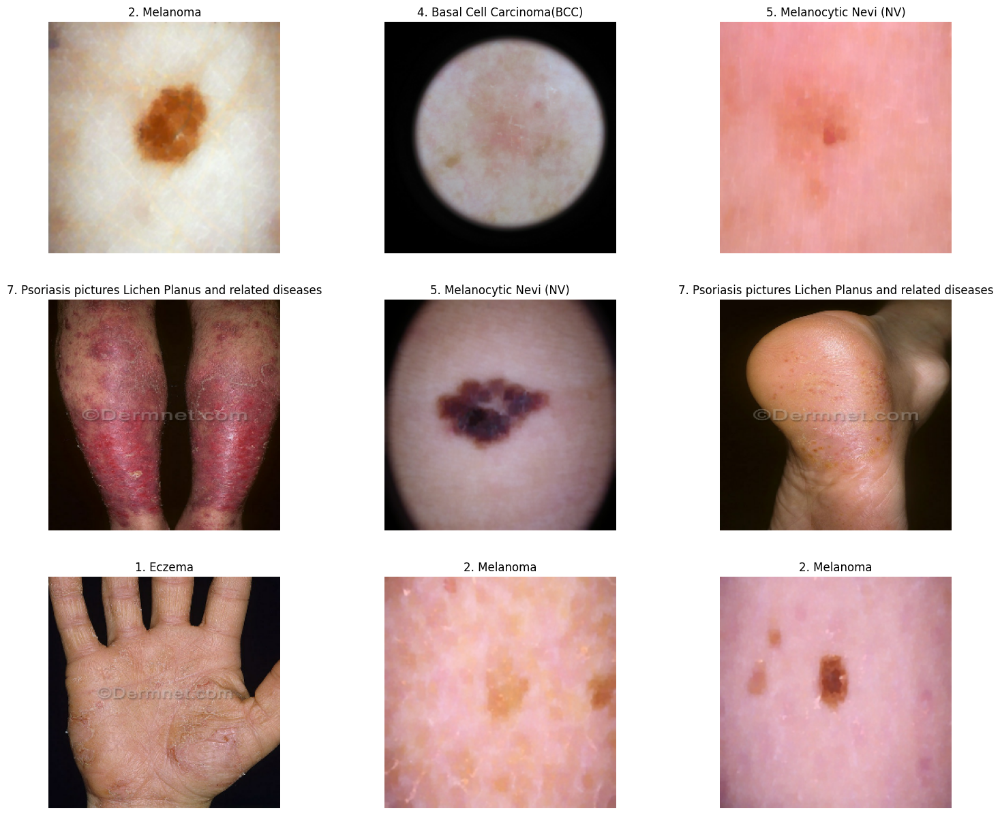

In [9]:
plt.figure(figsize=(18,15))
for i in range(9):
    for image_batch , label_batch in dataset.take(1):
       ax=plt.subplot(3,3,i+1)
        plt.imshow(image_batch[i].numpy().astype("uint8"))
        plt.title(class_names[label_batch[i]])
        # print(image_batch[0].shape)
        plt.axis("off")

In [10]:
def get_dataset_partitions_tf(ds,train_split=0.7 , test_split=0.2 , val_split=0.1, shuffle=True , shuffle_size=10000):
    ds_size=len(ds)

    if shuffle:
        ds=ds.shuffle(shuffle_size , seed=12)
        train_size=int(train_split*ds_size)
        val_size=int(val_split*ds_size)
        train_ds=ds.take(train_size)
        val_ds=ds.skip(train_size).take(val_size)
        test_ds=ds.skip(train_size).skip(val_size)
    return train_ds ,val_ds ,  test_ds 
    

In [11]:
train_ds , val_ds , test_ds =get_dataset_partitions_tf(dataset)

In [12]:
len(train_ds)

158

In [13]:
len(val_ds)

22

In [14]:
len(test_ds)

46

In [15]:
train_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
val_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
test_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>

In [16]:
resize_and_rescale=tf.keras.Sequential([
    tf.keras.layers.Resizing(IMAGE_SIZE, IMAGE_SIZE),
    tf.keras.layers.Rescaling(1.0/255)
])

In [17]:
data_augmentation=tf.keras.Sequential([
     tf.keras.layers.RandomFlip("horizontal_and_vertical"),
     tf.keras.layers.RandomRotation(0.2),
])

<h1>Try with CNN algorithm</h1>

In [18]:

input_shape=(BATCH_SIZE , IMAGE_SIZE, IMAGE_SIZE, CHANNELS)
n_classes=5
model_cnn= models.Sequential([
    resize_and_rescale,
    data_augmentation,
    layers.Conv2D(32,(3,3),activation='relu' , input_shape=input_shape),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(64,kernel_size=(3,3),activation='relu'),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(64,kernel_size=(3,3),activation='relu'),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(64,(3,3),activation='relu'),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(64,(3,3),activation='relu'),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(64,(3,3),activation='relu'),
    layers.MaxPooling2D((2,2)),
    layers.Flatten(),
    layers.Dense(64,activation='relu'),
    layers.Dense(n_classes,activation='softmax'),  
])
model_cnn.build(input_shape=input_shape)

c:\Users\Padidar\AppData\Local\Programs\Python\Python39\lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [19]:
model_cnn.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ sequential (Sequential)         │ (32, 256, 256, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_1 (Sequential)       │ (32, 256, 256, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (32, 254, 254, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (32, 127, 127, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (32, 125, 125, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (32, 62, 62, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (32, 60, 60, 64)       │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (32, 30, 30, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (32, 28, 28, 64)       │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (32, 14, 14, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (32, 12, 12, 64)       │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (32, 6, 6, 64)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (32, 4, 4, 64)         │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (32, 2, 2, 64)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (32, 256)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (32, 64)               │        16,448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (32, 5)                │           325 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 183,877 (718.27 KB)

 Trainable params: 183,877 (718.27 KB)

 Non-trainable params: 0 (0.00 B)

In [20]:
class Precision(tf.keras.metrics.Metric):
    def __init__(self, name='precision', **kwargs):
        super(Precision, self).__init__(name=name, **kwargs)
        self.precision_metric = tf.keras.metrics.Precision()

    def update_state(self, y_true, y_pred, sample_weight=None):
        y_true = tf.cast(y_true, tf.int32)
        y_pred = tf.argmax(y_pred, axis=-1)
        self.precision_metric.update_state(y_true, y_pred, sample_weight)

    def result(self):
        return self.precision_metric.result()

    def reset_states(self):
        self.precision_metric.reset_states()

class Recall(tf.keras.metrics.Metric):
    def __init__(self, name='recall', **kwargs):
        super(Recall, self).__init__(name=name, **kwargs)
        self.recall_metric = tf.keras.metrics.Recall()

    def update_state(self, y_true, y_pred, sample_weight=None):
        y_true = tf.cast(y_true, tf.int32)
        y_pred = tf.argmax(y_pred, axis=-1)
        self.recall_metric.update_state(y_true, y_pred, sample_weight)

    def result(self):
        return self.recall_metric.result()

    def reset_states(self):
        self.recall_metric.reset_states()

class F1Score(tf.keras.metrics.Metric):
    def __init__(self, name='f1_score', **kwargs):
        super(F1Score, self).__init__(name=name, **kwargs)
        self.precision_metric = Precision(name='precision')
        self.recall_metric = Recall(name='recall')
        self.f1_score = self.add_weight(name='f1_score', initializer='zeros')

    def update_state(self, y_true, y_pred, sample_weight=None):
        self.precision_metric.update_state(y_true, y_pred, sample_weight)
        self.recall_metric.update_state(y_true, y_pred, sample_weight)

        precision_value = self.precision_metric.result()
        recall_value = self.recall_metric.result()

        
        f1_value = tf.cond(
            tf.equal(precision_value + recall_value, 0),
            true_fn=lambda: 0.0,
            false_fn=lambda: 2 * (precision_value * recall_value) / (precision_value + recall_value)
        )
        self.f1_score.assign(f1_value)

    def result(self):
        return self.f1_score

    def reset_states(self):
        self.precision_metric.reset_states()
        self.recall_metric.reset_states()
        self.f1_score.assign(0)


In [21]:
model_cnn.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=[
        'accuracy',
        Precision(name='precision'),
        Recall(name='recall'),
        F1Score(name='f1_score')
    ]
)

In [23]:
history_cnn = model_cnn.fit(
    train_ds,
    epochs=EPOCHS,
    batch_size=BATCH_SIZE,
    verbose=1,
    validation_data=val_ds
)

Epoch 1/30
158/158 ━━━━━━━━━━━━━━━━━━━━ 96s 573ms/step - accuracy: 0.7151 - f1_score: 0.8990 - loss: 0.5911 - precision: 0.9027 - recall: 0.8954 - val_accuracy: 0.7528 - val_f1_score: 0.9033 - val_loss: 0.5302 - val_precision: 0.9450 - val_recall: 0.8651
Epoch 2/30
158/158 ━━━━━━━━━━━━━━━━━━━━ 93s 570ms/step - accuracy: 0.7146 - f1_score: 0.8964 - loss: 0.5814 - precision: 0.9020 - recall: 0.8912 - val_accuracy: 0.7441 - val_f1_score: 0.9113 - val_loss: 0.5759 - val_precision: 0.9267 - val_recall: 0.8964
Epoch 3/30
158/158 ━━━━━━━━━━━━━━━━━━━━ 93s 571ms/step - accuracy: 0.7351 - f1_score: 0.9020 - loss: 0.5642 - precision: 0.9107 - recall: 0.8938 - val_accuracy: 0.7216 - val_f1_score: 0.9006 - val_loss: 0.5638 - val_precision: 0.8727 - val_recall: 0.9304
Epoch 4/30
158/158 ━━━━━━━━━━━━━━━━━━━━ 93s 570ms/step - accuracy: 0.7126 - f1_score: 0.9031 - loss: 0.5952 - precision: 0.8871 - recall: 0.9206 - val_accuracy: 0.7060 - val_f1_score: 0.8681 - val_loss: 0.5492 - val_precision: 0.9435 -

In [24]:
scores=model_cnn.evaluate(test_ds)

46/46 ━━━━━━━━━━━━━━━━━━━━ 7s 110ms/step - accuracy: 0.7874 - f1_score: 0.9120 - loss: 0.4294 - precision: 0.8819 - recall: 0.9449


In [25]:
scores

[0.4315807819366455,
 0.7927989363670349,
 0.8774860501289368,
 0.9500430822372437,
 <KerasVariable shape=(), dtype=float32, path=f1_score/f1_score>]

In [26]:
history_cnn

In [27]:
history_cnn.params

{'verbose': 1, 'epochs': 30, 'steps': 158}

In [29]:
acc_cnn=history_cnn.history['accuracy']
val_acc_cnn=history_cnn.history['val_accuracy']


loss_cnn=history_cnn.history['loss']
val_loss_cnn=history_cnn.history['val_loss']

In [30]:
print(history_cnn.history['f1_score'])

[<KerasVariable shape=(), dtype=float32, path=f1_score/f1_score>, <KerasVariable shape=(), dtype=float32, path=f1_score/f1_score>, <KerasVariable shape=(), dtype=float32, path=f1_score/f1_score>, <KerasVariable shape=(), dtype=float32, path=f1_score/f1_score>, <KerasVariable shape=(), dtype=float32, path=f1_score/f1_score>, <KerasVariable shape=(), dtype=float32, path=f1_score/f1_score>, <KerasVariable shape=(), dtype=float32, path=f1_score/f1_score>, <KerasVariable shape=(), dtype=float32, path=f1_score/f1_score>, <KerasVariable shape=(), dtype=float32, path=f1_score/f1_score>, <KerasVariable shape=(), dtype=float32, path=f1_score/f1_score>, <KerasVariable shape=(), dtype=float32, path=f1_score/f1_score>, <KerasVariable shape=(), dtype=float32, path=f1_score/f1_score>, <KerasVariable shape=(), dtype=float32, path=f1_score/f1_score>, <KerasVariable shape=(), dtype=float32, path=f1_score/f1_score>, <KerasVariable shape=(), dtype=float32, path=f1_score/f1_score>, <KerasVariable shape=(),

In [31]:
len(history_cnn.history['accuracy'])

30

In [32]:
print(history_cnn.history['accuracy'])

[0.7098249793052673, 0.7177610993385315, 0.736155092716217, 0.7068417072296143, 0.7264636158943176, 0.7185522317886353, 0.7300237417221069, 0.7430389523506165, 0.7396579384803772, 0.7565632462501526, 0.7490055561065674, 0.7571202516555786, 0.7484177350997925, 0.7446300983428955, 0.7620648741722107, 0.753381073474884, 0.7620648741722107, 0.7535799741744995, 0.762330949306488, 0.7667064666748047, 0.7606803774833679, 0.7702863812446594, 0.7782418727874756, 0.7804296016693115, 0.7708830833435059, 0.770087480545044, 0.7800318002700806, 0.7818217873573303, 0.7905728220939636, 0.7873813509941101]


Text(0.5, 1.0, 'Trainig and Validation Accuracy for CNN')

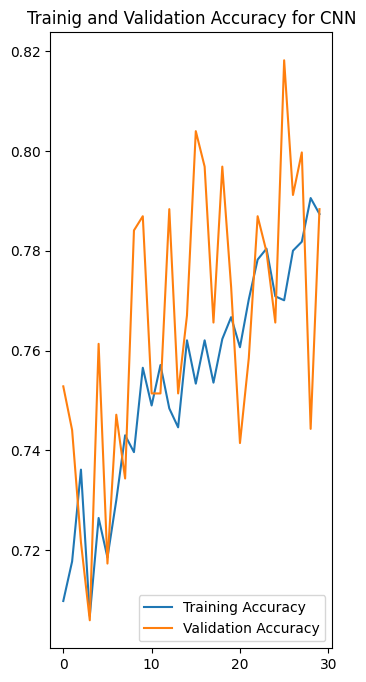

In [33]:
plt.figure(figsize=(8,8))
plt.subplot(1,2,1)
plt.plot(range(EPOCHS),acc_cnn, label='Training Accuracy')
plt.plot(range(EPOCHS), val_acc_cnn,label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Trainig and Validation Accuracy for CNN')

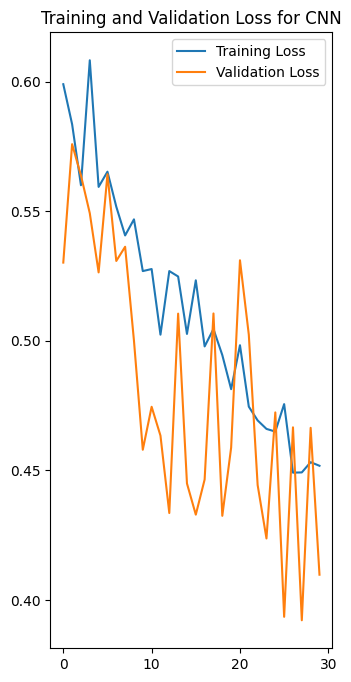

In [34]:
plt.figure(figsize=(8,8))

plt.subplot(1,2,2)
plt.plot(range(EPOCHS),loss_cnn, label="Training Loss")
plt.plot(range(EPOCHS),val_loss_cnn , label="Validation Loss")
plt.legend(loc='upper right')
plt.title("Training and Validation Loss for CNN")
plt.show()

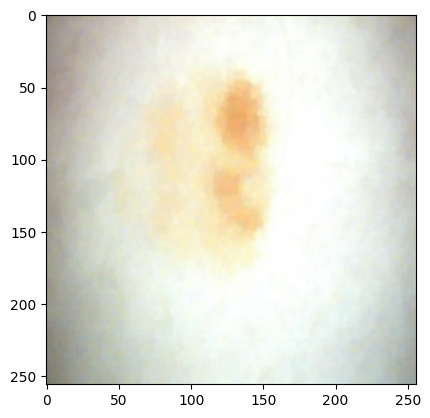

In [35]:
for images_batch , labels_batch in test_ds.take(1):
    plt.imshow(images_batch[0].numpy().astype('uint8'))

In [36]:
for images_batch , labels_batch in test_ds.take(1):
    print(images_batch[0].numpy().astype('uint8'))

[[[154 140 137]
  [151 137 135]
  [148 133 133]
  ...
  [141 128 112]
  [143 130 113]
  [144 128 112]]

 [[154 140 139]
  [152 138 138]
  [149 134 138]
  ...
  [144 128 112]
  [145 129 113]
  [144 128 112]]

 [[154 140 139]
  [152 138 138]
  [149 134 137]
  ...
  [144 128 113]
  [145 129 113]
  [144 128 112]]

 ...

 [[ 78  70  50]
  [ 77  68  51]
  [ 78  67  52]
  ...
  [ 30  25  19]
  [ 30  26  18]
  [ 30  25  19]]

 [[ 79  71  50]
  [ 79  71  52]
  [ 78  69  53]
  ...
  [ 30  25  19]
  [ 29  24  18]
  [ 30  25  19]]

 [[ 80  73  55]
  [ 80  73  54]
  [ 80  72  59]
  ...
  [ 29  26  21]
  [ 28  25  20]
  [ 29  26  21]]]


first image to predict 
first image's actual label: 2. Melanoma
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step
predicted label  2. Melanoma


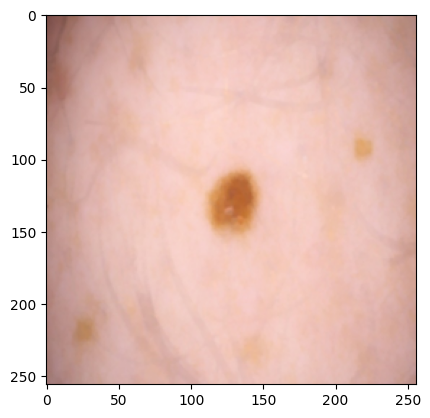

In [38]:
for images_batch , labels_batch in test_ds.take(1):
    first_image=images_batch[0].numpy().astype('uint8')
    first_label= labels_batch[0].numpy()

    print("first image to predict ")
    plt.imshow(first_image)
    print("first image's actual label:",class_names[first_label])

    batch_prediction=model_cnn.predict(images_batch)
    print("predicted label ",class_names[np.argmax(batch_prediction[0])])

In [39]:
def prediction(model_cnn, img):
    img_array_1=tf.keras.preprocessing.image.img_to_array(images[i].numpy())
    img_array=tf.expand_dims(img_array_1,0) # create a batch 

    predictions=model_cnn.predict(img_array)

    predicted_class=class_names[np.argmax(predictions[0])]

    confidence=round(100*(np.max(predictions[0])),2)
    return predicted_class,confidence

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


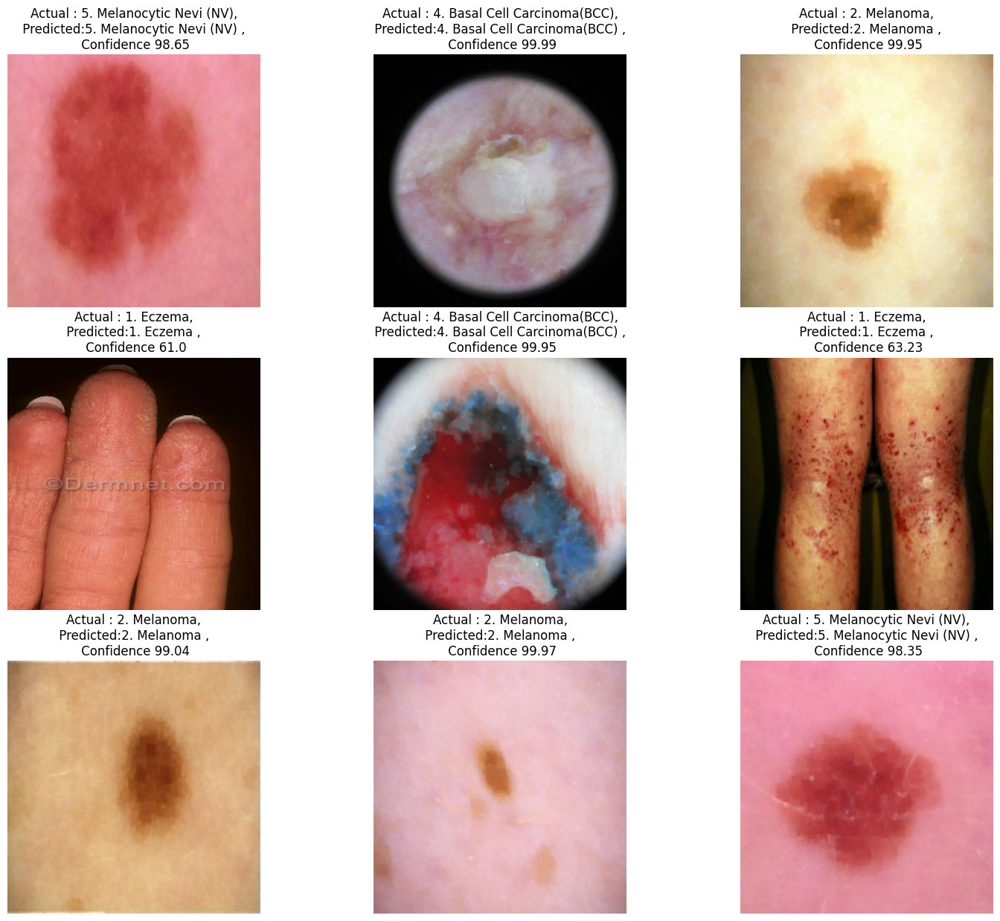

In [40]:
plt.figure(figsize=(18,15))
for images,labels in test_ds.take(1):
    for i in range(9): 
        ax=plt.subplot(3,3,i+1)
        plt.imshow(images[i].numpy().astype('uint8'))
        predicted_class,confidence=prediction(model_cnn,images[i].numpy())
        actual_class=class_names[labels[i]]
        plt.title(f"Actual : {actual_class},\n Predicted:{predicted_class} , \n Confidence {confidence}")
        plt.axis("off")

In [37]:
model_cnn.save('my_model_cnn_v4.keras')

In [41]:
test_labels_cnn = []
predictions_cnn = []

for images, labels in test_ds:
    preds_cnn = model_cnn.predict(images)
    predictions_cnn.extend(preds_cnn)
    test_labels_cnn.extend(labels.numpy())

test_labels_cnn = np.array(test_labels_cnn)
predictions_cnn = np.array(predictions_cnn)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s

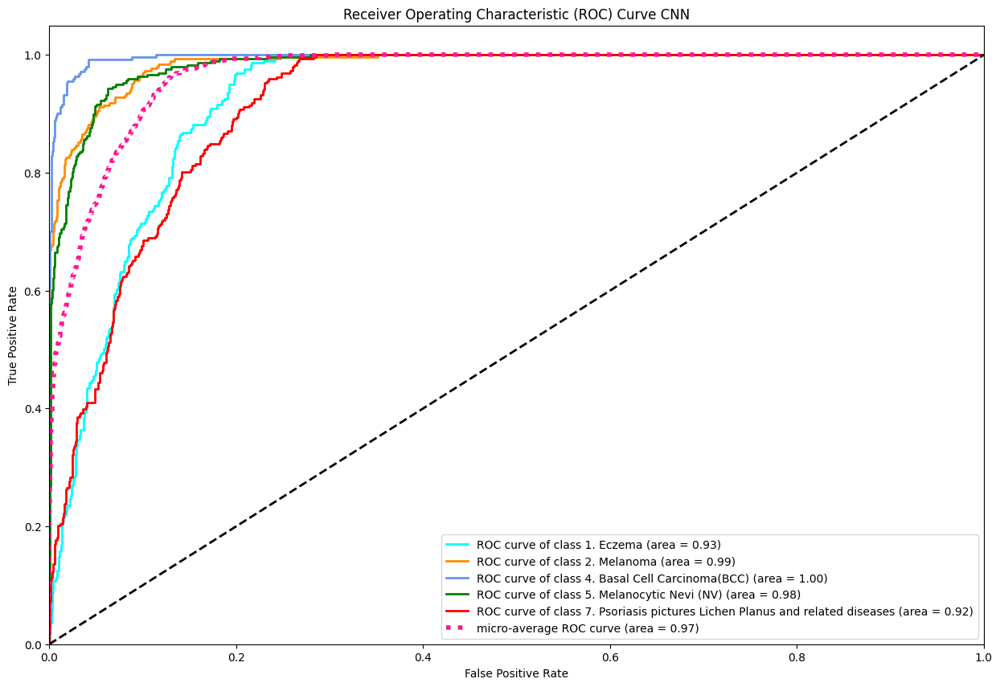

In [42]:
from itertools import cycle
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize


n_classes = len(class_names)
test_labels_binarized_cnn= label_binarize(test_labels_cnn, classes=range(n_classes))

fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(test_labels_binarized_cnn[:, i], predictions_cnn[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])


fpr["micro"], tpr["micro"], _ = roc_curve(test_labels_binarized_cnn.ravel(), predictions_cnn.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])


plt.figure(figsize=(15, 10))
colors = cycle(['aqua', 'darkorange', 'cornflowerblue', 'green', 'red'])

for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC curve of class {class_names[i]} (area = {roc_auc[i]:0.2f})')

plt.plot(fpr["micro"], tpr["micro"], color='deeppink', linestyle=':', linewidth=4,
         label=f'micro-average ROC curve (area = {roc_auc["micro"]:0.2f})')

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve CNN')
plt.legend(loc="lower right")
plt.show()

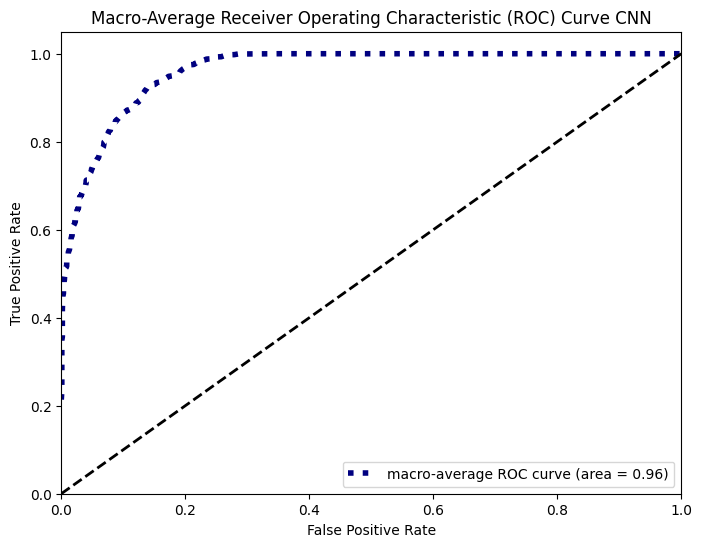

In [43]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize


n_classes = len(class_names)


test_labels_binarized_cnn = label_binarize(test_labels_cnn, classes=range(n_classes))


fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(test_labels_binarized_cnn[:, i], predictions_cnn[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))


mean_tpr = np.zeros_like(all_fpr)
for i in range(n_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])


mean_tpr /= n_classes

fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])


plt.figure(figsize=(8, 6))
plt.plot(fpr["macro"], tpr["macro"], color='navy', linestyle=':', linewidth=4,
         label=f'macro-average ROC curve (area = {roc_auc["macro"]:0.2f})')

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Macro-Average Receiver Operating Characteristic (ROC) Curve CNN')
plt.legend(loc="lower right")
plt.show()


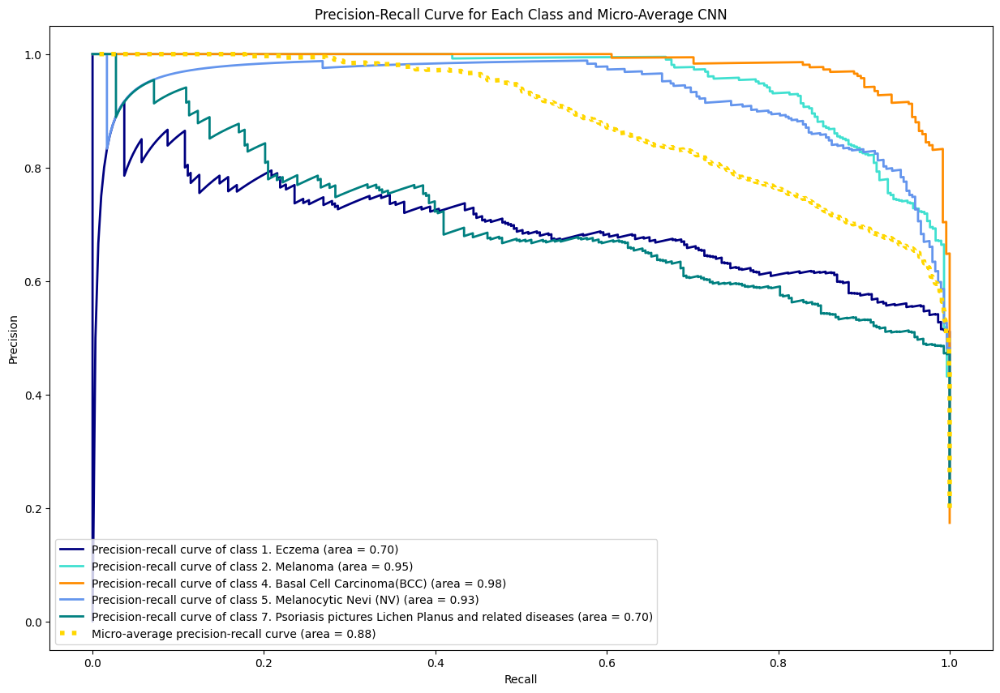

In [44]:
from sklearn.metrics import precision_recall_curve, average_precision_score
from sklearn.preprocessing import label_binarize

n_classes = len(class_names)
test_labels_binarized_cnn = label_binarize(test_labels_cnn, classes=range(n_classes))


precision = dict()
recall = dict()
average_precision = dict()
for i in range(n_classes):
    precision[i], recall[i], _ = precision_recall_curve(test_labels_binarized_cnn[:, i], predictions_cnn[:, i])
    average_precision[i] = average_precision_score(test_labels_binarized_cnn[:, i], predictions_cnn[:, i])

precision["micro"], recall["micro"], _ = precision_recall_curve(test_labels_binarized_cnn.ravel(), predictions_cnn.ravel())
average_precision["micro"] = average_precision_score(test_labels_binarized_cnn, predictions_cnn, average="micro")


plt.figure(figsize=(15, 10))
colors = cycle(['navy', 'turquoise', 'darkorange', 'cornflowerblue', 'teal'])

for i, color in zip(range(n_classes), colors):
    plt.plot(recall[i], precision[i], color=color, lw=2,
             label=f'Precision-recall curve of class {class_names[i]} (area = {average_precision[i]:0.2f})')

plt.plot(recall["micro"], precision["micro"], color='gold', linestyle=':', linewidth=4,
         label=f'Micro-average precision-recall curve (area = {average_precision["micro"]:0.2f})')

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve for Each Class and Micro-Average CNN')
plt.legend(loc="lower left")
plt.show()


In [45]:
predicted_classes_cnn=np.argmax(predictions_cnn,axis=1)

In [46]:
from sklearn.metrics import f1_score, matthews_corrcoef


f1_scores_cnn = f1_score(test_labels_cnn, predicted_classes_cnn, average=None)


f1_score_macro_cnn = f1_score(test_labels_cnn, predicted_classes_cnn, average='macro')


print(f'F1 scores for each class CNN: {f1_scores_cnn}')
print(f'Macro-average F1 score CNN: {f1_score_macro_cnn}')


F1 scores for each class CNN: [0.57028112 0.85714286 0.91967871 0.84775087 0.66567164]
Macro-average F1 score CNN: 0.7721050406686469


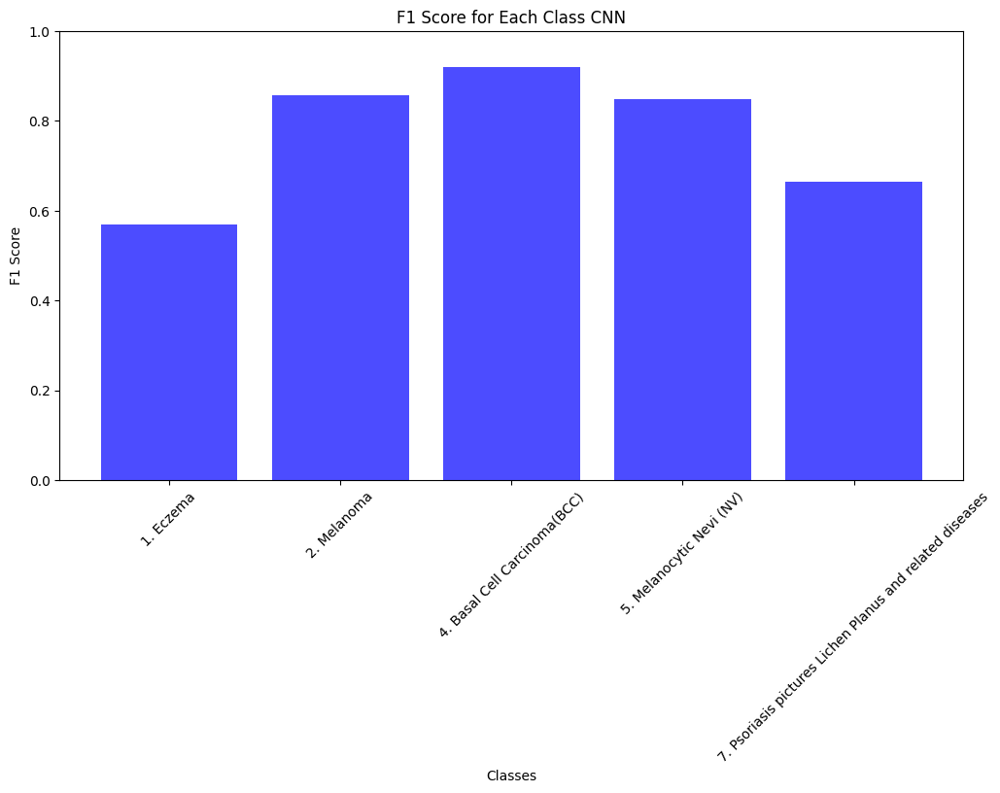

In [47]:
plt.figure(figsize=(12, 6))
plt.bar(np.arange(len(class_names)), f1_scores_cnn, color='b', alpha=0.7)
plt.xlabel('Classes')
plt.ylabel('F1 Score')
plt.title('F1 Score for Each Class CNN')
plt.xticks(np.arange(len(class_names)), class_names, rotation=45)
plt.ylim(0, 1)
plt.show()




In [48]:
train_loss_cnn = history_cnn.history['loss']
val_loss_cnn = history_cnn.history['val_loss']
epochs = range(1, len(train_loss_cnn) + 1)


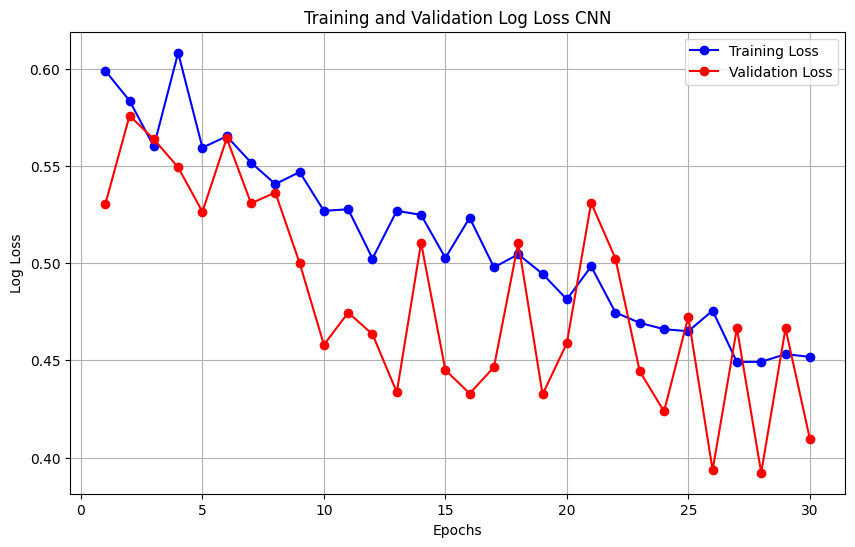

In [49]:
plt.figure(figsize=(10, 6))
plt.plot(epochs, train_loss_cnn, 'bo-', label='Training Loss')
plt.plot(epochs, val_loss_cnn, 'ro-', label='Validation Loss')
plt.title('Training and Validation Log Loss CNN')
plt.xlabel('Epochs')
plt.ylabel('Log Loss')
plt.legend()
plt.grid(True)
plt.show()


In [50]:
from sklearn.metrics import cohen_kappa_score
kappa = cohen_kappa_score(test_labels_cnn, predicted_classes_cnn)
print(f'Cohen\'s Kappa: {kappa:.4f}')

Cohen's Kappa: 0.7149


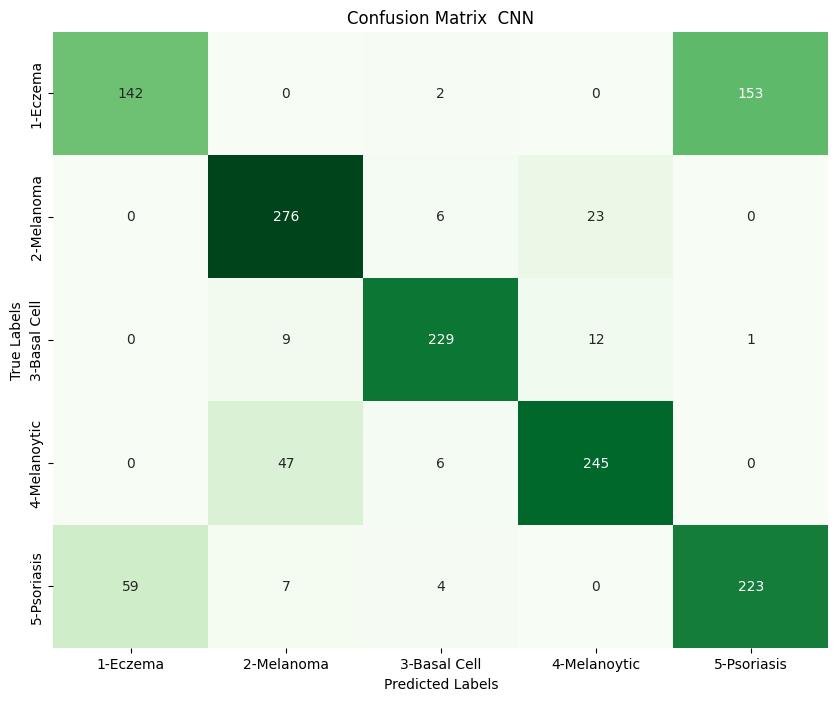

In [148]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

conf_matrix = confusion_matrix(test_labels_cnn, predicted_classes_cnn)

plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Greens', cbar=False)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix  CNN')


names=['1-Eczema','2-Melanoma','3-Basal Cell','4-Melanoytic','5-Psoriasis']
plt.xticks(ticks=np.arange(len(names))+0.5 , labels=names)
plt.yticks(ticks=np.arange(len(names))+0.5 , labels=names)
plt.show()


In [52]:
from sklearn.metrics import cohen_kappa_score

kappa_scores = []

for class_idx in range(len(class_names)):
    true_class_labels = (test_labels_cnn == class_idx)
    pred_class_labels = (predicted_classes_cnn == class_idx)
    
    kappa = cohen_kappa_score(true_class_labels, pred_class_labels)
    kappa_scores.append(kappa)


for class_idx, class_name in enumerate(class_names):
    sum=0
    print(f'Cohen\'s Kappa for class "{class_name}": {kappa_scores[class_idx]:.4f}')
    sum+=kappa_scores[class_idx]
print(" the average of the kapp scores ",sum/5)

Cohen's Kappa for class "1. Eczema": 0.4847
Cohen's Kappa for class "2. Melanoma": 0.8163
Cohen's Kappa for class "4. Basal Cell Carcinoma(BCC)": 0.9029
Cohen's Kappa for class "5. Melanocytic Nevi (NV)": 0.8097
Cohen's Kappa for class "7. Psoriasis pictures Lichen Planus and related diseases": 0.5667
 the average of the kapp scores  0.11334738895035616


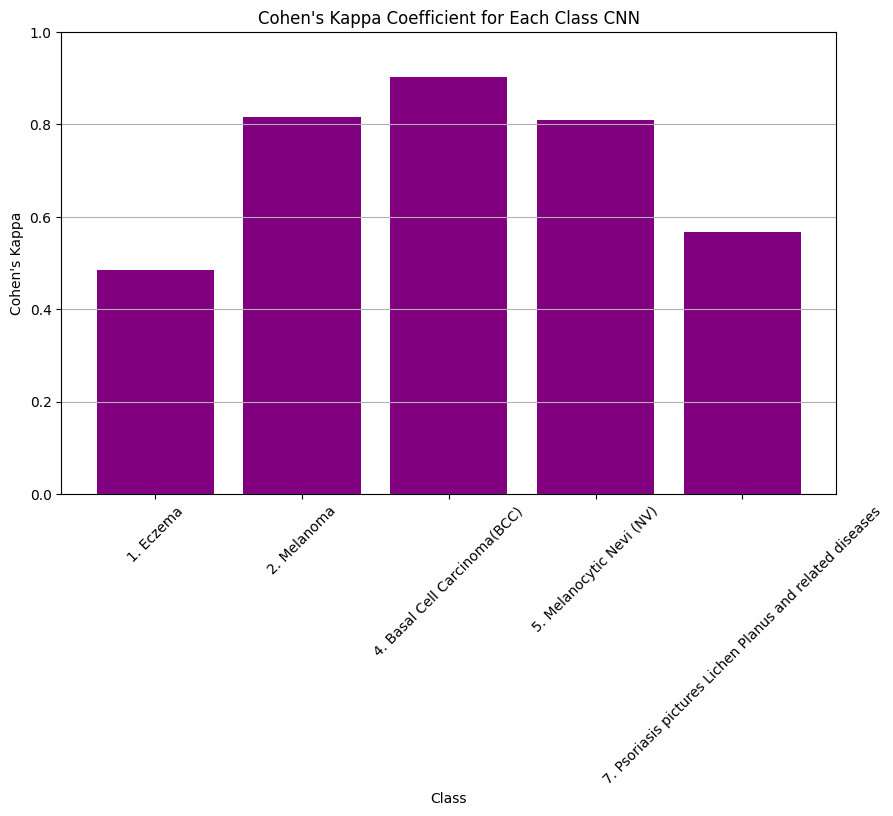

In [53]:
plt.figure(figsize=(10, 6))
plt.bar(class_names, kappa_scores, color='purple')
plt.xlabel('Class')
plt.ylabel('Cohen\'s Kappa')
plt.title('Cohen\'s Kappa Coefficient for Each Class CNN')
plt.ylim(0, 1)  
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.show()


<h1>Try with VGG-16 algorithm</h1>

In [54]:
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras.applications import VGG16
from tensorflow.keras.layers import Input

def build_vgg16(input_shape=(IMAGE_SIZE, IMAGE_SIZE, CHANNELS), num_classes=NUM_CLASSES):
    base_model = VGG16(weights=None, include_top=False, input_tensor=Input(shape=input_shape))
    weights_path = 'C:\\model\\vgg16_weights_tf_dim_ordering_tf_kernels_notop.h5'
    base_model.load_weights(weights_path)

    base_model.trainable = False

    model_vgg = tf.keras.Sequential([
        base_model,
        tf.keras.layers.GlobalAveragePooling2D(),
        tf.keras.layers.Dense(512, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(num_classes, activation='softmax')
    ])
    
    return model_vgg

model_vgg = build_vgg16()

model_vgg.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',
    metrics=[
        'accuracy',
        Precision(name='precision'),
        Recall(name='recall'),
        F1Score(name='f1_score')
    ]
)

In [55]:
history_vgg = model_vgg.fit(
    train_ds,
    epochs=EPOCHS,
    validation_data=val_ds
)

Epoch 1/30
158/158 ━━━━━━━━━━━━━━━━━━━━ 367s 2s/step - accuracy: 0.5946 - f1_score: 0.8839 - loss: 1.6414 - precision: 0.8877 - recall: 0.8798 - val_accuracy: 0.8239 - val_f1_score: 0.9327 - val_loss: 0.4177 - val_precision: 0.8994 - val_recall: 0.9685
Epoch 2/30
158/158 ━━━━━━━━━━━━━━━━━━━━ 378s 2s/step - accuracy: 0.7767 - f1_score: 0.9198 - loss: 0.5479 - precision: 0.9166 - recall: 0.9228 - val_accuracy: 0.8267 - val_f1_score: 0.9393 - val_loss: 0.3777 - val_precision: 0.9669 - val_recall: 0.9132
Epoch 3/30
158/158 ━━━━━━━━━━━━━━━━━━━━ 363s 2s/step - accuracy: 0.8127 - f1_score: 0.9342 - loss: 0.4269 - precision: 0.9355 - recall: 0.9330 - val_accuracy: 0.8551 - val_f1_score: 0.9391 - val_loss: 0.3363 - val_precision: 0.9015 - val_recall: 0.9800
Epoch 4/30
158/158 ━━━━━━━━━━━━━━━━━━━━ 364s 2s/step - accuracy: 0.8182 - f1_score: 0.9328 - loss: 0.4090 - precision: 0.9322 - recall: 0.9333 - val_accuracy: 0.8878 - val_f1_score: 0.9493 - val_loss: 0.2695 - val_precision: 0.9850 - val_rec

In [56]:
scores=model_vgg.evaluate(test_ds)

46/46 ━━━━━━━━━━━━━━━━━━━━ 89s 2s/step - accuracy: 0.9683 - f1_score: 0.9851 - loss: 0.0847 - precision: 0.9954 - recall: 0.9750


In [57]:
model_vgg.summary()

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ vgg16 (Functional)              │ (None, 8, 8, 512)      │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 512)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 512)            │       262,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 5)              │         2,565 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 15,510,353 (59.17 MB)

 Trainable params: 265,221 (1.01 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

 Optimizer params: 530,444 (2.02 MB)

In [58]:
history_vgg.params

{'verbose': 'auto', 'epochs': 30, 'steps': 158}

In [59]:
history_vgg.history.keys()

dict_keys(['accuracy', 'f1_score', 'loss', 'precision', 'recall', 'val_accuracy', 'val_f1_score', 'val_loss', 'val_precision', 'val_recall'])

In [60]:
history_vgg.history['accuracy']

[0.6883452534675598,
 0.7810262441635132,
 0.8088703155517578,
 0.8332673907279968,
 0.8369132876396179,
 0.8474542498588562,
 0.8552215099334717,
 0.8747016787528992,
 0.876093864440918,
 0.8709228038787842,
 0.8804693818092346,
 0.8906125426292419,
 0.8906125426292419,
 0.8991646766662598,
 0.9040743708610535,
 0.9091089963912964,
 0.9125791192054749,
 0.9154733419418335,
 0.9088212251663208,
 0.9216388463973999,
 0.9291964769363403,
 0.9285996556282043,
 0.9329753518104553,
 0.9293953776359558,
 0.9434335231781006,
 0.9357597231864929,
 0.9421241283416748,
 0.9417263269424438,
 0.9405330419540405,
 0.9409307837486267]

In [61]:
acc_vgg=history_vgg.history['accuracy']
val_acc_vgg=history_vgg.history['val_accuracy']


loss_vgg=history_vgg.history['loss']
val_loss_vgg=history_vgg.history['val_loss']

In [62]:
len(history_vgg.history['accuracy'])

30

Text(0.5, 1.0, 'Training and Validation Accuracy VGG-16')

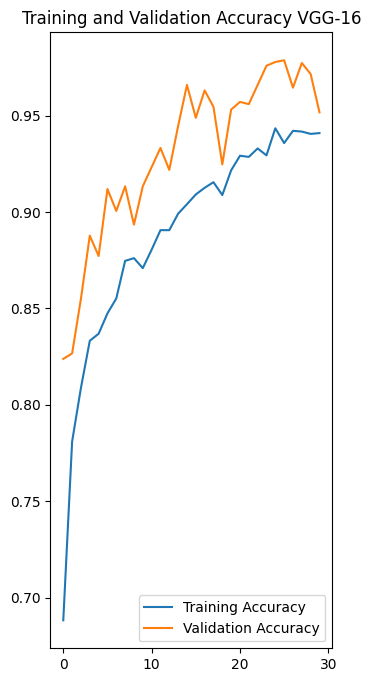

In [63]:
plt.figure(figsize=(8,8))
plt.subplot(1,2,1)
plt.plot(range(EPOCHS),acc_vgg,label="Training Accuracy")
plt.plot(range(EPOCHS),val_acc_vgg,label="Validation Accuracy")
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy VGG-16')

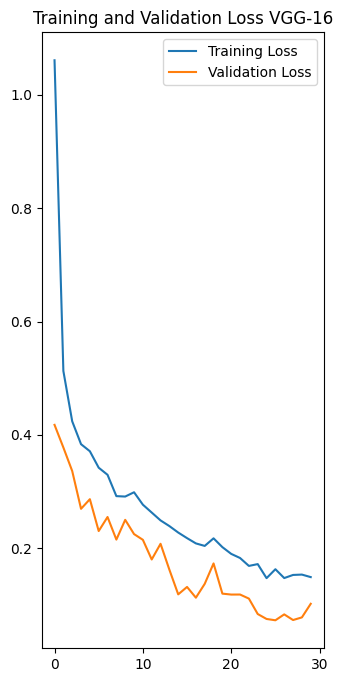

In [64]:
plt.figure(figsize=(8,8))

plt.subplot(1,2,2)
plt.plot(range(EPOCHS),loss_vgg,label="Training Loss")
plt.plot(range(EPOCHS),val_loss_vgg,label="Validation Loss")
plt.legend(loc='upper right')
plt.title("Training and Validation Loss VGG-16")
plt.show()

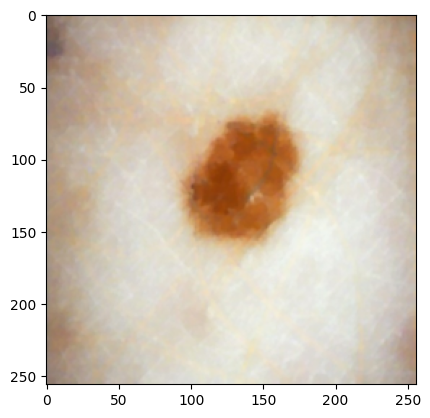

In [65]:
for images_batch , labels_batch in test_ds.take(1):
    plt.imshow(image_batch[0].numpy().astype('uint8'))

[[[ 5  1  0]
  [ 5  1  0]
  [ 6  0  0]
  ...
  [22  4  4]
  [25  7  7]
  [17  0  0]]

 [[ 5  1  0]
  [ 5  1  0]
  [ 6  0  0]
  ...
  [21  4  4]
  [17  1  1]
  [22  5  5]]

 [[ 5  1  0]
  [ 5  1  0]
  [ 6  0  0]
  ...
  [16  1  1]
  [18  2  2]
  [20  4  4]]

 ...

 [[ 7  1  1]
  [ 6  0  0]
  [ 6  0  0]
  ...
  [14  0  0]
  [14  0  0]
  [13  0  0]]

 [[ 6  0  0]
  [ 7  0  1]
  [ 7  0  0]
  ...
  [13  0  0]
  [15  1  0]
  [17  3  2]]

 [[ 9  0  1]
  [ 8  0  0]
  [ 8  0  0]
  ...
  [16  2  1]
  [16  2  1]
  [16  2  1]]]


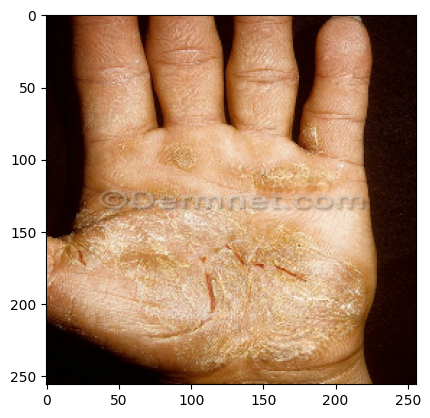

In [66]:
for images_batch, labels_batch in test_ds.take(1):

    image = (images_batch[0].numpy()).astype('uint8')
    print(image)
    plt.imshow(image)
    plt.show()

first image to predict
first image's actual label: 1. Eczema
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
predicted label  1. Eczema


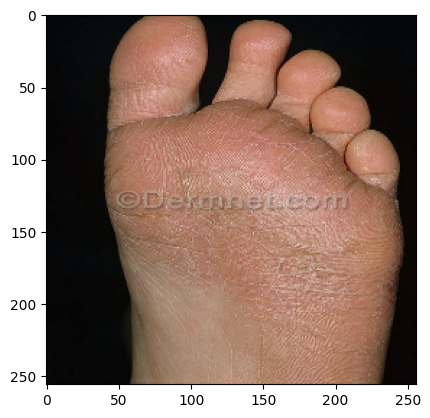

In [67]:
for images_batch , labels_batch in test_ds.take(1):
    first_image=(images_batch[0].numpy()).astype('uint8')
    first_label=labels_batch[0].numpy()

    print("first image to predict")
    plt.imshow(first_image)
    print("first image's actual label:" , class_names[first_label])

    batch_prediction=model_vgg.predict(images_batch)
    print("predicted label " , class_names[np.argmax(batch_prediction[0])])

In [68]:
def prediction(model_vgg,img):
    img_array_1=tf.keras.preprocessing.image.img_to_array(images[i].numpy())
    img_array=tf.expand_dims(img_array_1,0)


    predictions_vgg=model_vgg.predict(img_array)
    predicted_class=class_names[np.argmax(predictions_vgg[0])]


    confidence=round(100*(np.max(predictions_vgg[0])),2)
    return predicted_class,confidence 
    

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 241ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


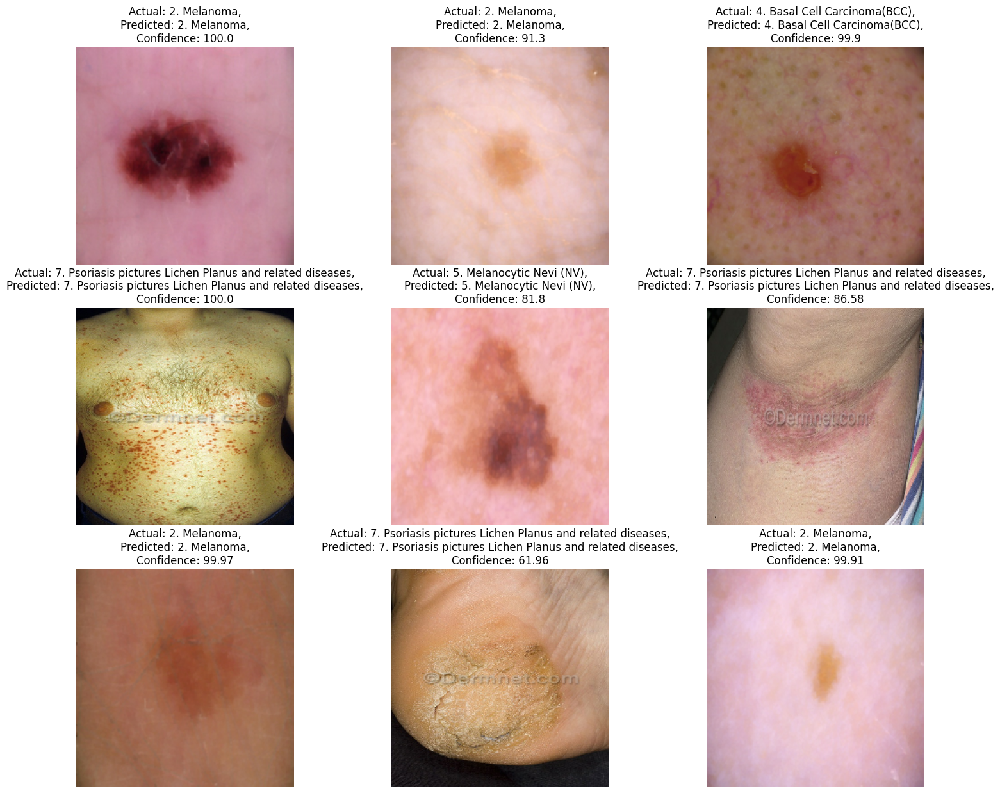

In [69]:
plt.figure(figsize=(18, 15))
for images, labels in test_ds.take(1):
    for i in range(9): 
        ax = plt.subplot(3, 3, i + 1)
        image = (images[i].numpy()).astype('uint8')  
        plt.imshow(image)
        
        predicted_class, confidence = prediction(model_vgg, images[i].numpy())
        actual_class = class_names[labels[i]]
        
        plt.title(f"Actual: {actual_class},\nPredicted: {predicted_class},\nConfidence: {confidence}")
        plt.axis("off")
plt.show()

In [54]:
model_vgg.save('my_model_vgg16_v3.keras')

In [70]:
test_labels_vgg = []
predictions_vgg = []

for images, labels in test_ds:
    preds = model_vgg.predict(images)
    predictions_vgg.extend(preds)
    test_labels_vgg.extend(labels.numpy())

test_labels_vgg = np.array(test_labels_vgg)
predictions_vgg = np.array(predictions_vgg)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 

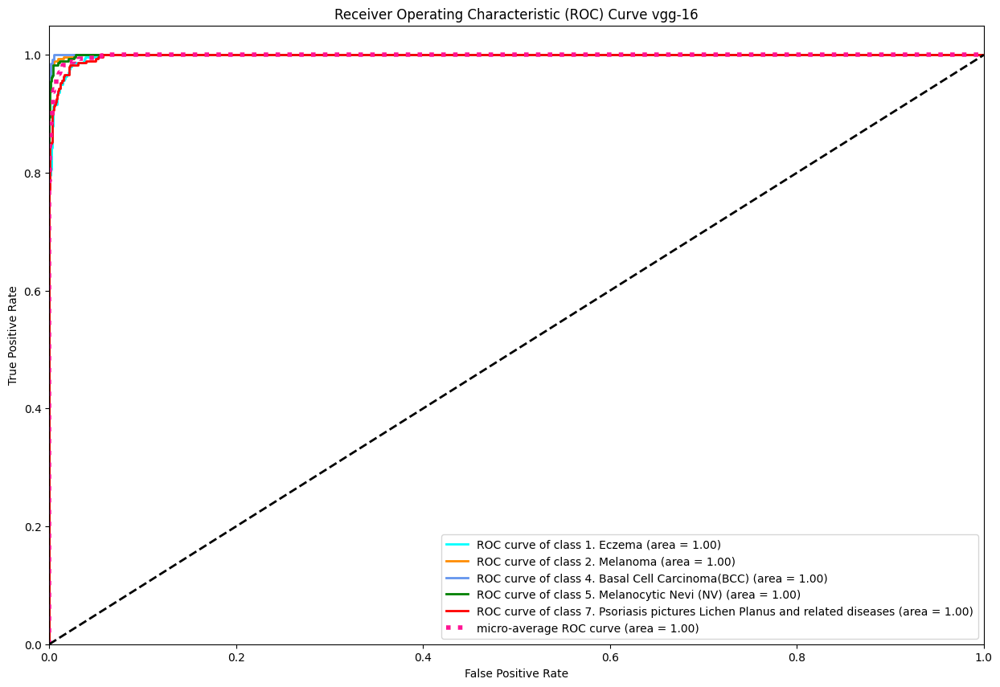

In [71]:
n_classes = len(class_names)
test_labels_binarized = label_binarize(test_labels_vgg, classes=range(n_classes))

fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(test_labels_binarized[:, i], predictions_vgg[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fpr["micro"], tpr["micro"], _ = roc_curve(test_labels_binarized.ravel(), predictions_vgg.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])


plt.figure(figsize=(15, 10))
colors = cycle(['aqua', 'darkorange', 'cornflowerblue', 'green', 'red'])

for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC curve of class {class_names[i]} (area = {roc_auc[i]:0.2f})')

plt.plot(fpr["micro"], tpr["micro"], color='deeppink', linestyle=':', linewidth=4,
         label=f'micro-average ROC curve (area = {roc_auc["micro"]:0.2f})')

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve vgg-16')
plt.legend(loc="lower right")
plt.show()


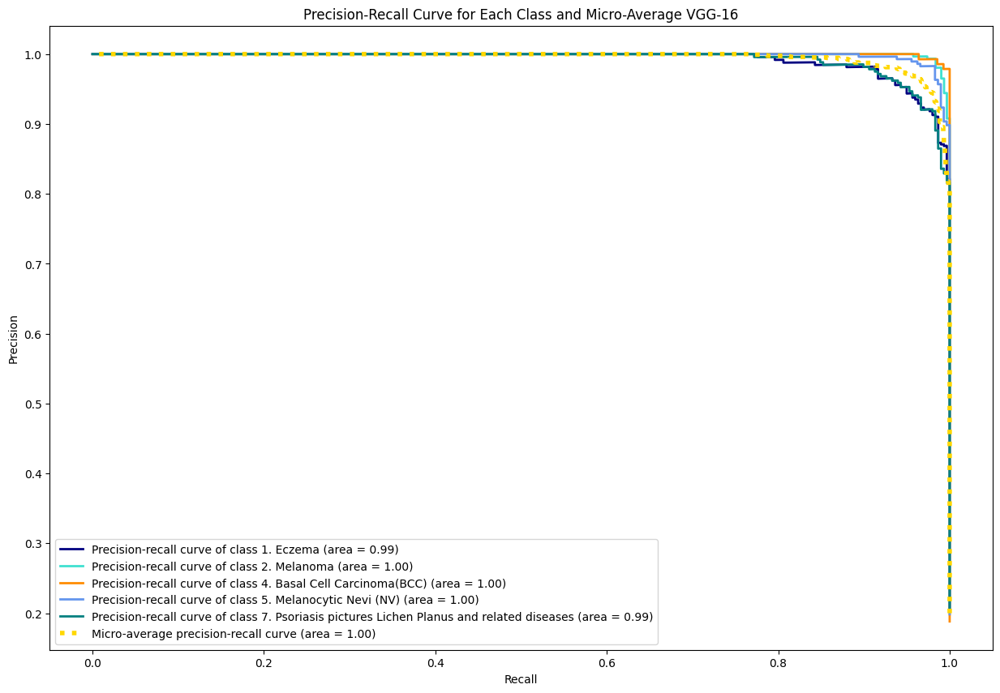

In [72]:
from sklearn.metrics import precision_recall_curve, average_precision_score

n_classes = len(class_names)
test_labels_binarized = label_binarize(test_labels_vgg, classes=range(n_classes))


precision = dict()
recall = dict()
average_precision = dict()
for i in range(n_classes):
    precision[i], recall[i], _ = precision_recall_curve(test_labels_binarized[:, i], predictions_vgg[:, i])
    average_precision[i] = average_precision_score(test_labels_binarized[:, i], predictions_vgg[:, i])

precision["micro"], recall["micro"], _ = precision_recall_curve(test_labels_binarized.ravel(), predictions_vgg.ravel())
average_precision["micro"] = average_precision_score(test_labels_binarized, predictions_vgg, average="micro")


plt.figure(figsize=(15, 10))
colors = cycle(['navy', 'turquoise', 'darkorange', 'cornflowerblue', 'teal'])

for i, color in zip(range(n_classes), colors):
    plt.plot(recall[i], precision[i], color=color, lw=2,
             label=f'Precision-recall curve of class {class_names[i]} (area = {average_precision[i]:0.2f})')

plt.plot(recall["micro"], precision["micro"], color='gold', linestyle=':', linewidth=4,
         label=f'Micro-average precision-recall curve (area = {average_precision["micro"]:0.2f})')

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve for Each Class and Micro-Average VGG-16')
plt.legend(loc="lower left")
plt.show()


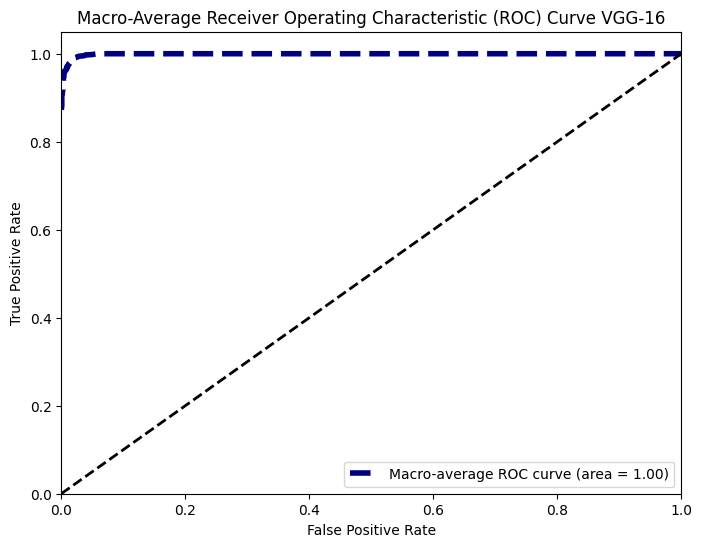

In [73]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt
import numpy as np

n_classes = len(class_names)
test_labels_binarized = label_binarize(test_labels_vgg, classes=range(n_classes))


fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(test_labels_binarized[:, i], predictions_vgg[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])


all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))
mean_tpr = np.zeros_like(all_fpr)

for i in range(n_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

mean_tpr /= n_classes


roc_auc["macro"] = auc(all_fpr, mean_tpr)


plt.figure(figsize=(8, 6))
plt.plot(all_fpr, mean_tpr, color='navy', linestyle='--', linewidth=4,
         label=f'Macro-average ROC curve (area = {roc_auc["macro"]:0.2f})')

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Macro-Average Receiver Operating Characteristic (ROC) Curve VGG-16')
plt.legend(loc="lower right")
plt.show()


In [74]:
predicted_classes_vgg=np.argmax(predictions_vgg,axis=1)

In [75]:
from sklearn.metrics import f1_score, matthews_corrcoef

f1_scores = f1_score(test_labels_vgg, predicted_classes_vgg, average=None)

f1_score_macro = f1_score(test_labels_vgg, predicted_classes_vgg, average='macro')


print(f'F1 scores for each class: {f1_scores}')
print(f'Macro-average F1 score: {f1_score_macro}')



F1 scores for each class: [0.94249201 0.98688525 0.9822695  0.97569444 0.93661972]
Macro-average F1 score: 0.964792184996319


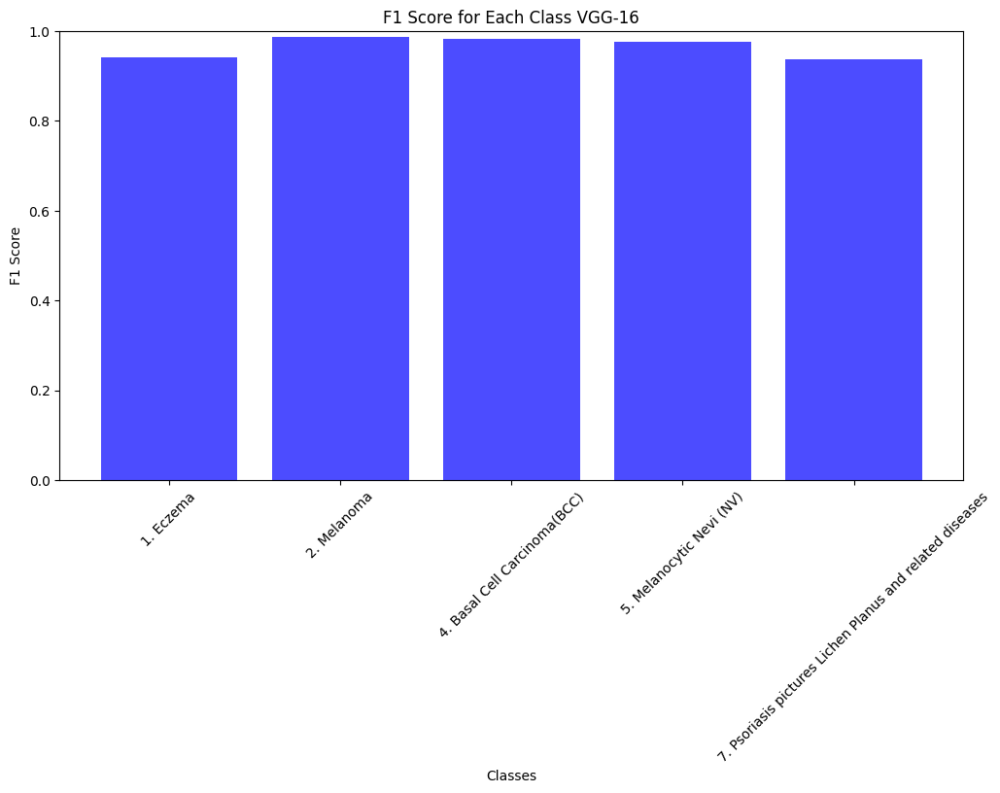

In [76]:
plt.figure(figsize=(12, 6))
plt.bar(np.arange(len(class_names)), f1_scores, color='b', alpha=0.7)
plt.xlabel('Classes')
plt.ylabel('F1 Score')
plt.title('F1 Score for Each Class VGG-16')
plt.xticks(np.arange(len(class_names)), class_names, rotation=45)
plt.ylim(0, 1)
plt.show()


In [77]:
train_loss = history_vgg.history['loss']
val_loss = history_vgg.history['val_loss']
epochs = range(1, len(train_loss) + 1)

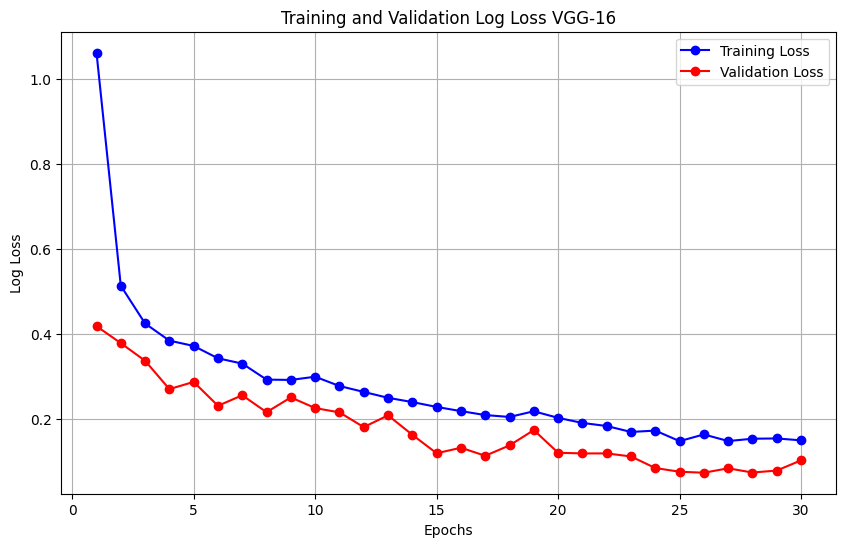

In [78]:
plt.figure(figsize=(10, 6))
plt.plot(epochs, train_loss, 'bo-', label='Training Loss')
plt.plot(epochs, val_loss, 'ro-', label='Validation Loss')
plt.title('Training and Validation Log Loss VGG-16')
plt.xlabel('Epochs')
plt.ylabel('Log Loss')
plt.legend()
plt.grid(True)
plt.show()

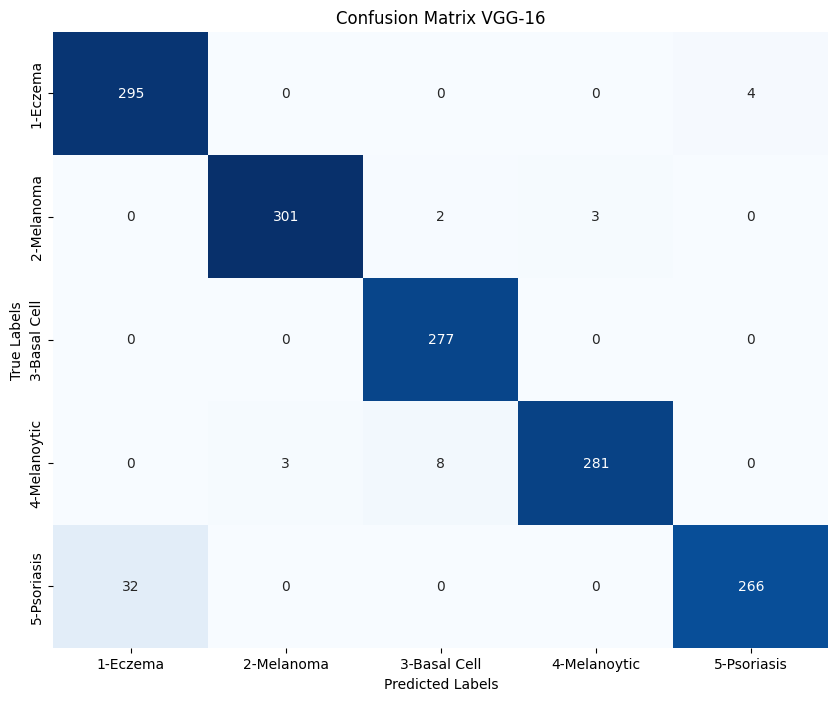

In [80]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

conf_matrix = confusion_matrix(test_labels_vgg, predicted_classes_vgg)

plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix VGG-16')

names=['1-Eczema','2-Melanoma','3-Basal Cell','4-Melanoytic','5-Psoriasis']
plt.xticks(ticks=np.arange(len(names))+0.5 , labels=names)
plt.yticks(ticks=np.arange(len(names))+0.5 , labels=names)
plt.show()

In [81]:
kappa = cohen_kappa_score(test_labels_vgg, predicted_classes_vgg)
print(f'Cohen\'s Kappa: {kappa:.4f}')

Cohen's Kappa: 0.9558


In [82]:
from sklearn.metrics import cohen_kappa_score
kappa_scores = []

for class_idx in range(len(class_names)):
    true_class_labels = (test_labels_vgg == class_idx)
    pred_class_labels = (predicted_classes_vgg == class_idx)
    
    kappa = cohen_kappa_score(true_class_labels, pred_class_labels)
    kappa_scores.append(kappa)

for class_idx, class_name in enumerate(class_names):
    sum=0
    print(f'Cohen\'s Kappa for class "{class_name}": {kappa_scores[class_idx]:.4f}')
    sum+=kappa_scores[class_idx]
print(" the average of the kapp scores ",sum/5)

Cohen's Kappa for class "1. Eczema": 0.9270
Cohen's Kappa for class "2. Melanoma": 0.9835
Cohen's Kappa for class "4. Basal Cell Carcinoma(BCC)": 0.9781
Cohen's Kappa for class "5. Melanocytic Nevi (NV)": 0.9698
Cohen's Kappa for class "7. Psoriasis pictures Lichen Planus and related diseases": 0.9215
 the average of the kapp scores  0.1843027595767622


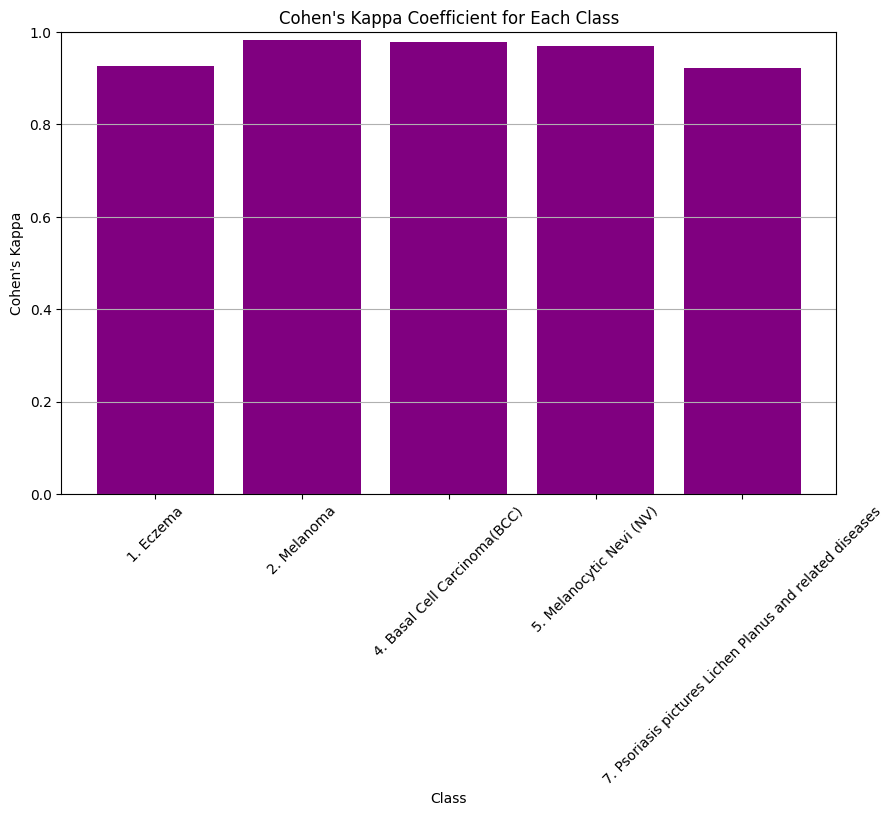

In [83]:
plt.figure(figsize=(10, 6))
plt.bar(class_names, kappa_scores, color='purple')
plt.xlabel('Class')
plt.ylabel('Cohen\'s Kappa')
plt.title('Cohen\'s Kappa Coefficient for Each Class')
plt.ylim(0, 1)  
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.show()

<h1>Try with ResNet50 Algorithm</h1>
<h4>Amazing Results</h4>

In [84]:
from tensorflow.keras.applications import ResNet50

weights_path = 'C:/model_resnet/resnet50_weights_tf_dim_ordering_tf_kernels_notop.h5'

def build_resnet50(input_shape=(256, 256, 3), num_classes=5):
    base_model = ResNet50(weights=None, include_top=False, input_tensor=Input(shape=input_shape))
    

    base_model.load_weights(weights_path)

    base_model.trainable = False

    model_resnet = tf.keras.Sequential([
        base_model,
        tf.keras.layers.GlobalAveragePooling2D(),
        tf.keras.layers.Dense(512, activation='relu'),
        tf.keras.layers.Dropout(0.5),
        tf.keras.layers.Dense(num_classes, activation='softmax')
    ])
    
    return model_resnet


IMAGE_SIZE = 256
BATCH_SIZE = 32
CHANNELS = 3
EPOCHS = 30
NUM_CLASSES = 5



model_resnet = build_resnet50(input_shape=(IMAGE_SIZE, IMAGE_SIZE, CHANNELS), num_classes=NUM_CLASSES)

model_resnet.compile(optimizer='adam',
                     loss='sparse_categorical_crossentropy',
                     metrics=['accuracy',Precision(name='precision'),Recall(name='recall'),F1Score(name='f1_score')],)

history_resnet = model_resnet.fit(train_ds,
                                  epochs=EPOCHS,
                                  validation_data=val_ds)

Epoch 1/30
158/158 ━━━━━━━━━━━━━━━━━━━━ 184s 1s/step - accuracy: 0.6721 - f1_score: 0.8979 - loss: 0.8983 - precision: 0.8937 - recall: 0.9021 - val_accuracy: 0.7983 - val_f1_score: 0.9113 - val_loss: 0.4067 - val_precision: 0.9801 - val_recall: 0.8515
Epoch 2/30
158/158 ━━━━━━━━━━━━━━━━━━━━ 182s 1s/step - accuracy: 0.7986 - f1_score: 0.9152 - loss: 0.4197 - precision: 0.9218 - recall: 0.9088 - val_accuracy: 0.8537 - val_f1_score: 0.9402 - val_loss: 0.3274 - val_precision: 0.9361 - val_recall: 0.9444
Epoch 3/30
158/158 ━━━━━━━━━━━━━━━━━━━━ 181s 1s/step - accuracy: 0.8265 - f1_score: 0.9300 - loss: 0.3918 - precision: 0.9311 - recall: 0.9289 - val_accuracy: 0.8636 - val_f1_score: 0.9362 - val_loss: 0.2934 - val_precision: 0.9178 - val_recall: 0.9554
Epoch 4/30
158/158 ━━━━━━━━━━━━━━━━━━━━ 182s 1s/step - accuracy: 0.8496 - f1_score: 0.9379 - loss: 0.3291 - precision: 0.9389 - recall: 0.9366 - val_accuracy: 0.9304 - val_f1_score: 0.9694 - val_loss: 0.2271 - val_precision: 0.9806 - val_rec

In [85]:
scores=model_resnet.evaluate(test_ds)

46/46 ━━━━━━━━━━━━━━━━━━━━ 48s 1s/step - accuracy: 0.9923 - f1_score: 0.9982 - loss: 0.0397 - precision: 0.9980 - recall: 0.9983


In [86]:
history_resnet.params

{'verbose': 'auto', 'epochs': 30, 'steps': 158}

In [87]:
history_resnet.history.keys()

dict_keys(['accuracy', 'f1_score', 'loss', 'precision', 'recall', 'val_accuracy', 'val_f1_score', 'val_loss', 'val_precision', 'val_recall'])

In [88]:
history_resnet.history['accuracy']

[0.7348846197128296,
 0.8102625012397766,
 0.8301511406898499,
 0.8500791192054749,
 0.8528242111206055,
 0.867143988609314,
 0.8687350749969482,
 0.8830549120903015,
 0.885043740272522,
 0.8898169994354248,
 0.8991646766662598,
 0.904469907283783,
 0.9120922684669495,
 0.9103022813796997,
 0.9262132048606873,
 0.9264121055603027,
 0.928003191947937,
 0.9278085231781006,
 0.9272076487541199,
 0.9408623576164246,
 0.9371519684791565,
 0.9377486109733582,
 0.9387430548667908,
 0.9431185126304626,
 0.9438291192054749,
 0.9458069801330566,
 0.9482895731925964,
 0.949960470199585,
 0.9509493708610535,
 0.9547072649002075]

In [89]:
acc_resnet=history_resnet.history['accuracy']
val_acc_resnet=history_resnet.history['val_accuracy']


loss_resnet=history_resnet.history['loss']
val_loss_resnet=history_resnet.history['val_loss']

Text(0.5, 1.0, 'Training and Validation Accuracy for ResNet-50')

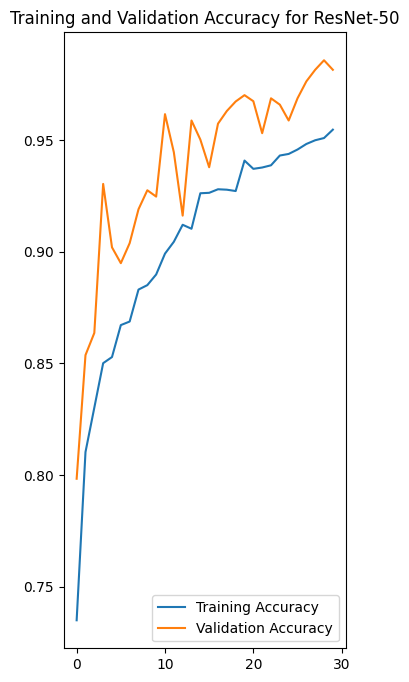

In [90]:
plt.figure(figsize=(8,8))
plt.subplot(1,2,1)
plt.plot(range(EPOCHS),acc_resnet, label='Training Accuracy')
plt.plot(range(EPOCHS),val_acc_resnet,label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy for ResNet-50')

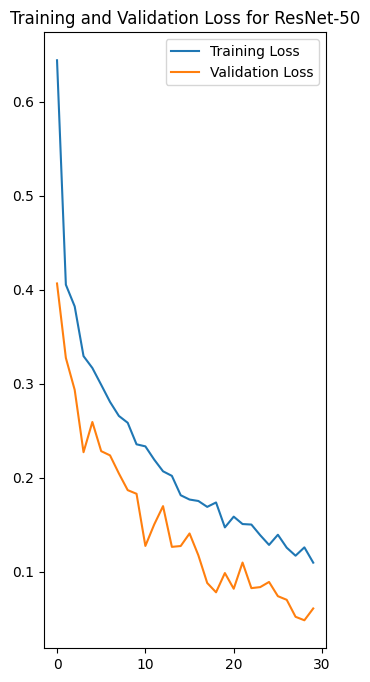

In [91]:
plt.figure(figsize=(8,8))

plt.subplot(1,2,2)
plt.plot(range(EPOCHS),loss_resnet , label="Training Loss")
plt.plot(range(EPOCHS),val_loss_resnet , label="Validation Loss")
plt.legend(loc='upper right')
plt.title("Training and Validation Loss for ResNet-50")
plt.show()

[[[1 1 1]
  [1 1 1]
  [0 0 0]
  ...
  [1 1 1]
  [0 0 0]
  [2 2 2]]

 [[0 0 0]
  [1 1 1]
  [1 1 1]
  ...
  [1 1 1]
  [0 0 0]
  [0 0 0]]

 [[1 1 1]
  [1 1 1]
  [1 1 1]
  ...
  [1 1 1]
  [1 1 1]
  [0 0 0]]

 ...

 [[2 2 2]
  [2 2 2]
  [2 2 2]
  ...
  [2 2 2]
  [2 2 2]
  [2 2 2]]

 [[2 2 2]
  [3 3 3]
  [2 2 2]
  ...
  [2 2 2]
  [2 2 2]
  [2 2 2]]

 [[2 2 2]
  [2 2 2]
  [2 2 2]
  ...
  [2 2 2]
  [1 1 1]
  [2 2 2]]]


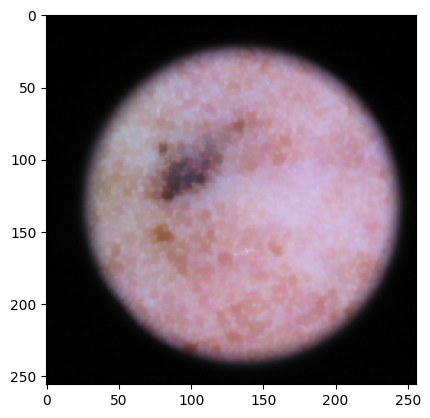

In [92]:
for images_batch, labels_batch in test_ds.take(1):

    image = (images_batch[0].numpy()).astype('uint8')
    print(image)
    plt.imshow(image)
    plt.show()

In [93]:
len(history_vgg.history['accuracy'])

30

first image to predict
first image's actual label: 5. Melanocytic Nevi (NV)
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
predicted label  5. Melanocytic Nevi (NV)


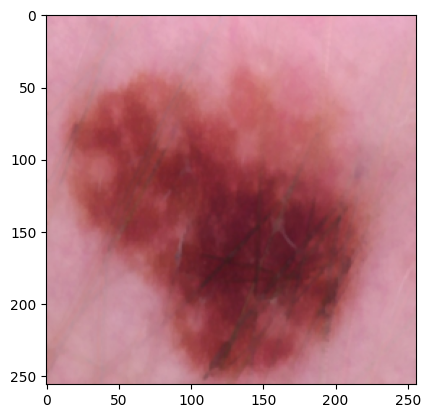

In [94]:
for images_batch , labels_batch in test_ds.take(1):
    first_image=(images_batch[0].numpy()).astype('uint8')
    first_label=labels_batch[0].numpy()

    print("first image to predict")
    plt.imshow(first_image)
    print("first image's actual label:" , class_names[first_label])

    batch_prediction=model_resnet.predict(images_batch)
    print("predicted label " , class_names[np.argmax(batch_prediction[0])])

In [95]:
def prediction(model_resnet,img):
    img_array_1=tf.keras.preprocessing.image.img_to_array(images[i].numpy())
    img_array=tf.expand_dims(img_array_1,0)


    predictions_resnet=model_resnet.predict(img_array)
    predicted_class_resnet=class_names[np.argmax(predictions_resnet[0])]


    confidence=round(100*(np.max(predictions_resnet[0])),2)
    return predicted_class_resnet,confidence 

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step


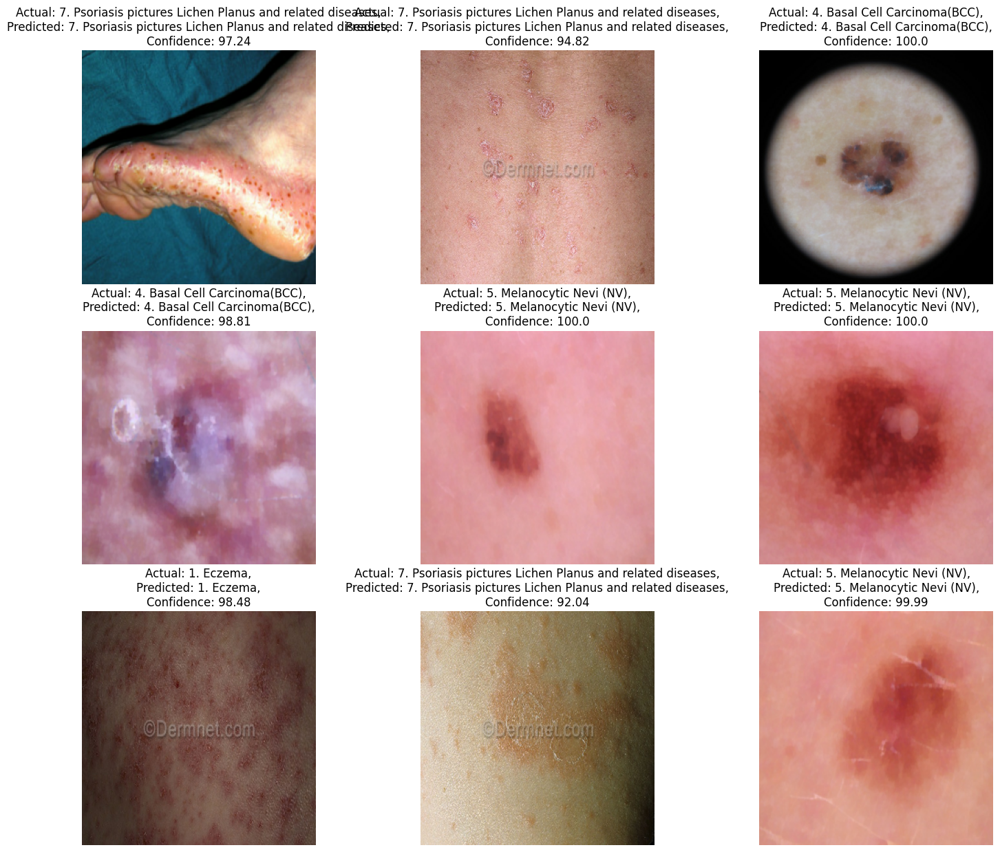

In [96]:
import tensorflow as tf
import matplotlib.pyplot as plt

plt.figure(figsize=(18, 15))
for images, labels in test_ds.take(1):
    for i in range(9): 
        ax = plt.subplot(3, 3, i + 1)
        image = (images[i].numpy()).astype('uint8') 
        plt.imshow(image)
        
        predicted_class_resnet, confidence = prediction(model_resnet, images[i].numpy())
        actual_class = class_names[labels[i]]
        
        plt.title(f"Actual: {actual_class},\nPredicted: {predicted_class_resnet},\nConfidence: {confidence}")
        plt.axis("off")
plt.show()

In [205]:
model_resnet.save("my_model_resNet50_v3.keras")

In [97]:
test_labels_resnet = []
predictions_resnet = []

for images, labels in test_ds:
    preds_resnet = model_resnet.predict(images)
    predictions_resnet.extend(preds_resnet)
    test_labels_resnet.extend(labels.numpy())

test_labels_resnet = np.array(test_labels_resnet)
predictions_resnet = np.array(predictions_resnet)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

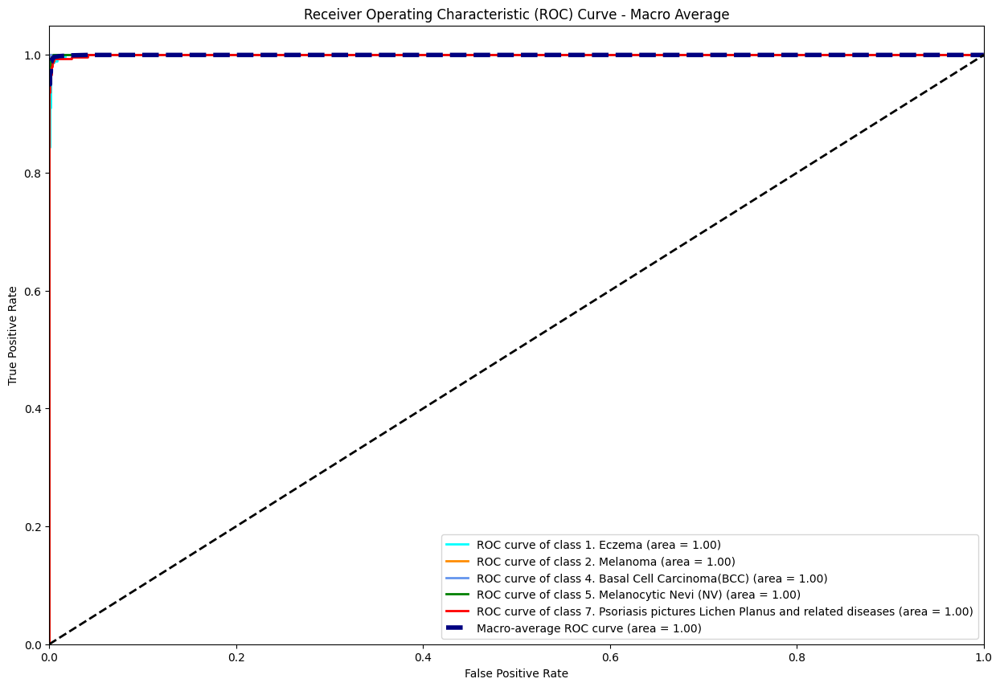

In [98]:
n_classes = len(class_names)
test_labels_binarized_resnet = label_binarize(test_labels_resnet, classes=range(n_classes))

fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(test_labels_binarized_resnet[:, i], predictions_resnet[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])


all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))
mean_tpr = np.zeros_like(all_fpr)

for i in range(n_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

mean_tpr /= n_classes


roc_auc["macro"] = auc(all_fpr, mean_tpr)


plt.figure(figsize=(15, 10))
colors = cycle(['aqua', 'darkorange', 'cornflowerblue', 'green', 'red'])


for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC curve of class {class_names[i]} (area = {roc_auc[i]:0.2f})')


plt.plot(all_fpr, mean_tpr, color='navy', linestyle='--', linewidth=4,
         label=f'Macro-average ROC curve (area = {roc_auc["macro"]:0.2f})')


plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve - Macro Average')
plt.legend(loc="lower right")
plt.show()

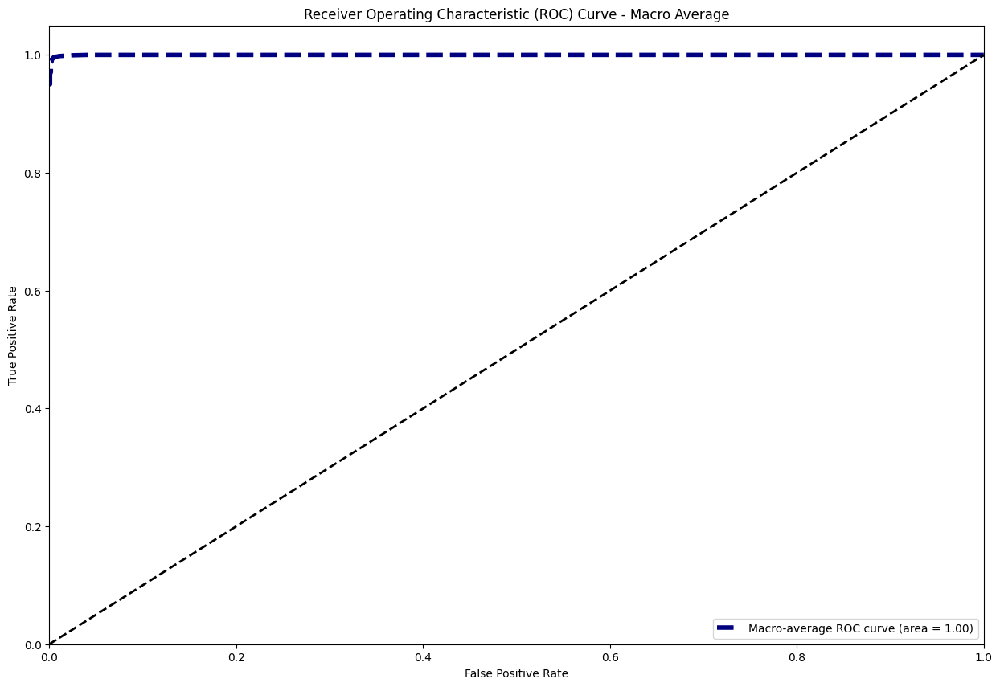

In [99]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize


n_classes = len(class_names)
test_labels_binarized_resnet = label_binarize(test_labels_resnet, classes=range(n_classes))

fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(test_labels_binarized_resnet[:, i], predictions_resnet[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])


all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))
mean_tpr = np.zeros_like(all_fpr)

for i in range(n_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i], left=0, right=0)

mean_tpr /= n_classes

roc_auc["macro"] = auc(all_fpr, mean_tpr)

plt.figure(figsize=(15, 10))

plt.plot(all_fpr, mean_tpr, color='navy', linestyle='--', linewidth=4,
         label=f'Macro-average ROC curve (area = {roc_auc["macro"]:0.2f})')

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve - Macro Average')
plt.legend(loc="lower right")
plt.show()


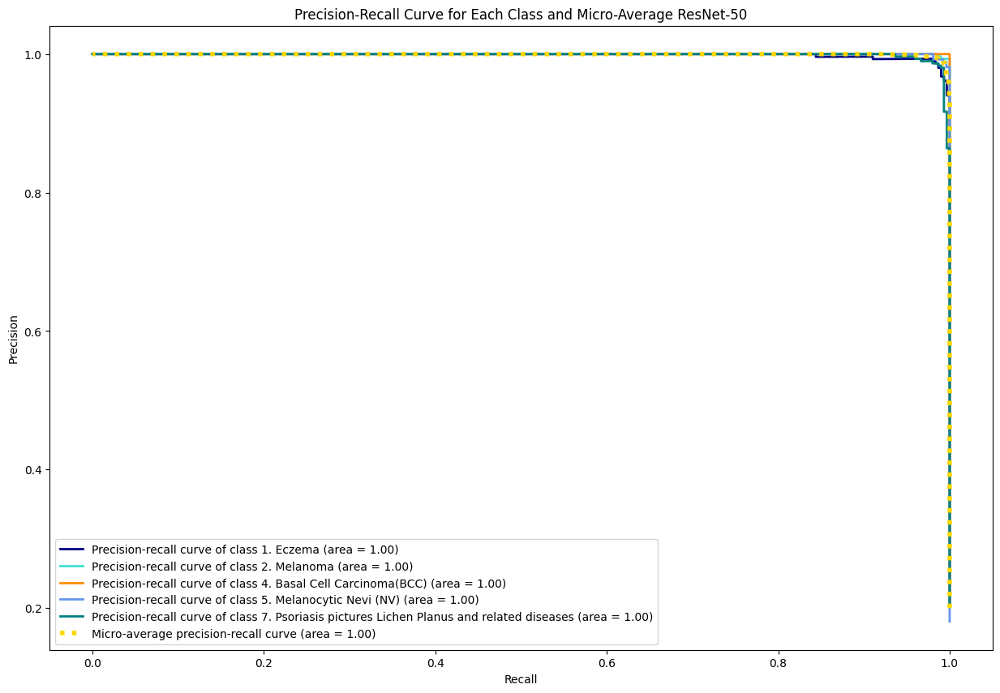

In [100]:
n_classes = len(class_names)
test_labels_binarized_resnet = label_binarize(test_labels_resnet, classes=range(n_classes))


precision = dict()
recall = dict()
average_precision = dict()
for i in range(n_classes):
    precision[i], recall[i], _ = precision_recall_curve(test_labels_binarized_resnet[:, i], predictions_resnet[:, i])
    average_precision[i] = average_precision_score(test_labels_binarized_resnet[:, i], predictions_resnet[:, i])


precision["micro"], recall["micro"], _ = precision_recall_curve(test_labels_binarized_resnet.ravel(), predictions_resnet.ravel())
average_precision["micro"] = average_precision_score(test_labels_binarized_resnet, predictions_resnet, average="micro")


plt.figure(figsize=(15, 10))
colors = cycle(['navy', 'turquoise', 'darkorange', 'cornflowerblue', 'teal'])

for i, color in zip(range(n_classes), colors):
    plt.plot(recall[i], precision[i], color=color, lw=2,
             label=f'Precision-recall curve of class {class_names[i]} (area = {average_precision[i]:0.2f})')

plt.plot(recall["micro"], precision["micro"], color='gold', linestyle=':', linewidth=4,
         label=f'Micro-average precision-recall curve (area = {average_precision["micro"]:0.2f})')

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve for Each Class and Micro-Average ResNet-50')
plt.legend(loc="lower left")
plt.show()

In [101]:
predicted_classes_resnet=np.argmax(predictions_resnet,axis=1)

In [102]:
f1_scores = f1_score(test_labels_resnet, predicted_classes_resnet, average=None)


f1_score_macro = f1_score(test_labels_resnet, predicted_classes_resnet, average='macro')
f1_score_micro = f1_score(test_labels_resnet, predicted_classes_resnet, average='micro')

mcc = matthews_corrcoef(test_labels_resnet, predicted_classes_resnet)

print(f'F1 scores for each class ResNet-50: {f1_scores}')
print(f'Macro-average F1 score ResNet-50: {f1_score_macro}')
print(f'Micro-average F1 score ResNet-50: {f1_score_micro}')
print(f'Matthews Correlation Coefficient (MCC) ResNet-50: {mcc}')


F1 scores for each class ResNet-50: [0.98662207 0.99312715 1.         0.99233716 0.98671096]
Macro-average F1 score ResNet-50: 0.9917594699102052
Micro-average F1 score ResNet-50: 0.9916897506925207
Matthews Correlation Coefficient (MCC) ResNet-50: 0.989615250812206


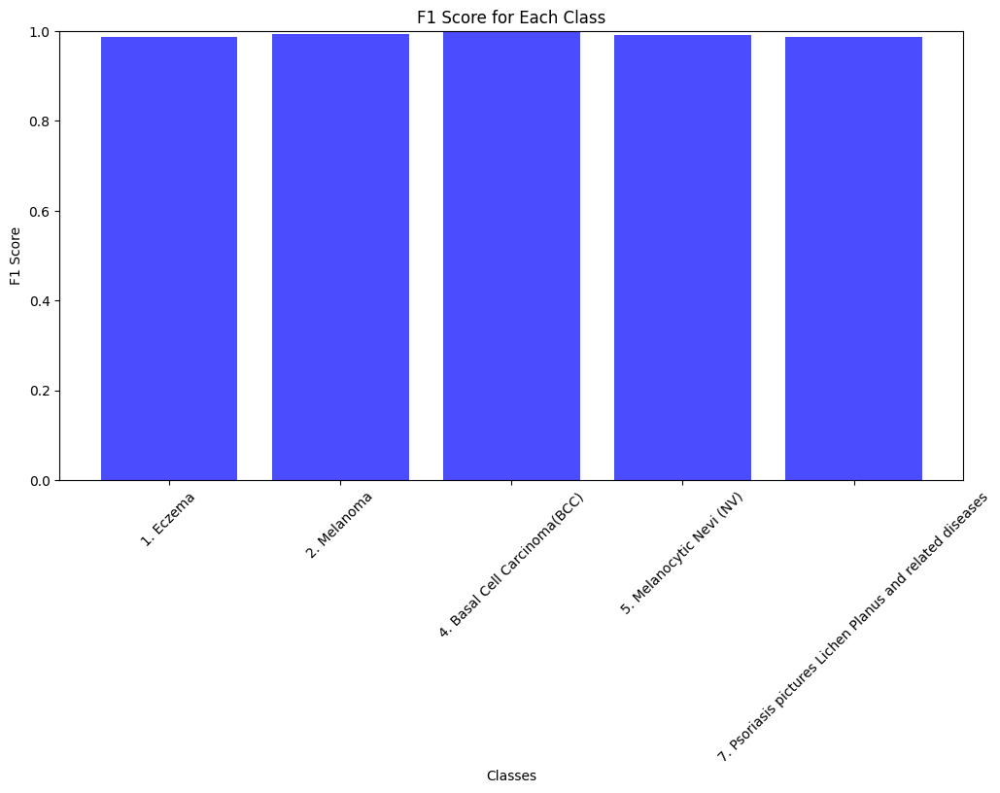

In [103]:
plt.figure(figsize=(12, 6))
plt.bar(np.arange(len(class_names)), f1_scores, color='b', alpha=0.7)
plt.xlabel('Classes')
plt.ylabel('F1 Score')
plt.title('F1 Score for Each Class')
plt.xticks(np.arange(len(class_names)), class_names, rotation=45)
plt.ylim(0, 1)
plt.show()


In [104]:
train_loss = history_resnet.history['loss']
val_loss = history_resnet.history['val_loss']
epochs = range(1, len(train_loss) + 1)

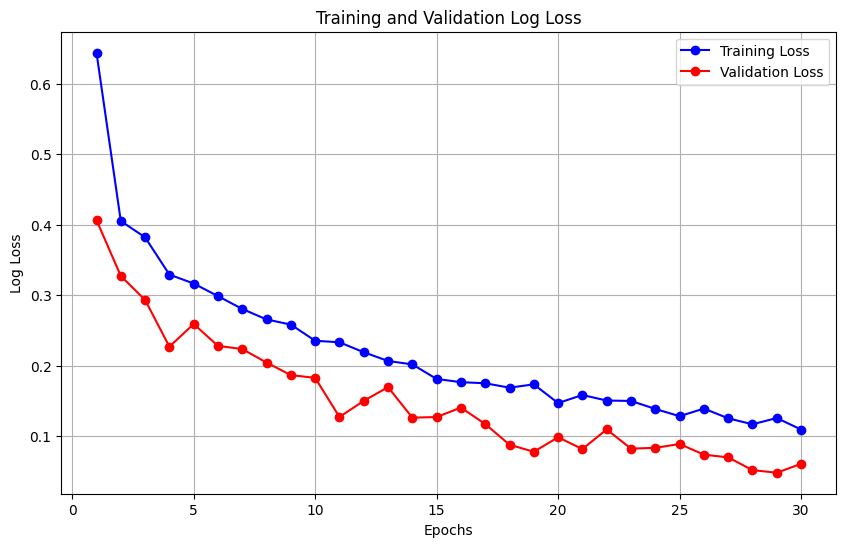

In [105]:

plt.figure(figsize=(10, 6))
plt.plot(epochs, train_loss, 'bo-', label='Training Loss')
plt.plot(epochs, val_loss, 'ro-', label='Validation Loss')
plt.title('Training and Validation Log Loss')
plt.xlabel('Epochs')
plt.ylabel('Log Loss')
plt.legend()
plt.grid(True)
plt.show()


In [106]:
kappa = cohen_kappa_score(test_labels_resnet, predicted_classes_resnet)
print(f'Cohen\'s Kappa: {kappa:.4f}')

Cohen's Kappa: 0.9896


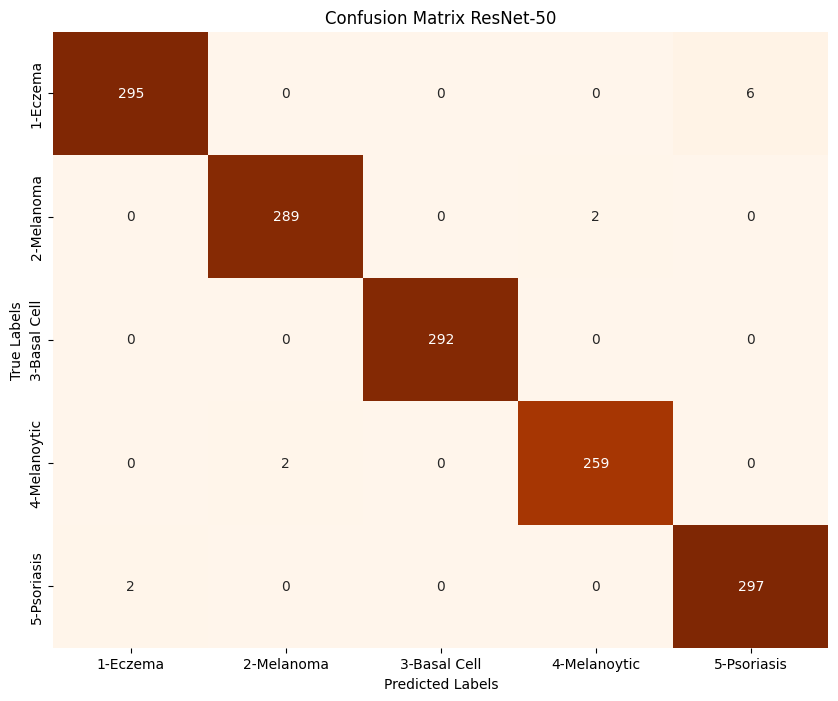

In [108]:
conf_matrix = confusion_matrix(test_labels_resnet, predicted_classes_resnet)

plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Oranges', cbar=False)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix ResNet-50')


names=['1-Eczema','2-Melanoma','3-Basal Cell','4-Melanoytic','5-Psoriasis']
plt.xticks(ticks=np.arange(len(names))+0.5 , labels=names)
plt.yticks(ticks=np.arange(len(names))+0.5 , labels=names)
plt.show()

In [109]:
kappa_scores = []

for class_idx in range(len(class_names)):
    true_class_labels = (test_labels_resnet == class_idx)
    pred_class_labels = (predicted_classes_resnet == class_idx)
    
    kappa = cohen_kappa_score(true_class_labels, pred_class_labels)
    kappa_scores.append(kappa)

for class_idx, class_name in enumerate(class_names):
    sum=0
    print(f'Cohen\'s Kappa for class "{class_name}": {kappa_scores[class_idx]:.4f}')
    sum+=kappa_scores[class_idx]
print(" the average of the kapp scores ",sum/5)

Cohen's Kappa for class "1. Eczema": 0.9831
Cohen's Kappa for class "2. Melanoma": 0.9914
Cohen's Kappa for class "4. Basal Cell Carcinoma(BCC)": 1.0000
Cohen's Kappa for class "5. Melanocytic Nevi (NV)": 0.9906
Cohen's Kappa for class "7. Psoriasis pictures Lichen Planus and related diseases": 0.9832
 the average of the kapp scores  0.19664231921801384


<h1> Try with LeNet Algorithm</h1>

In [110]:
def build_lenet(input_shape=(256, 256, 3), num_classes=5):
    model = models.Sequential()
    model.add(layers.Conv2D(6, (5, 5), activation='tanh', input_shape=input_shape))
    model.add(layers.AveragePooling2D(pool_size=(2, 2))) 
    model.add(layers.Conv2D(16, (5, 5), activation='tanh'))
    model.add(layers.AveragePooling2D(pool_size=(2, 2))) 
    model.add(layers.Flatten())
    model.add(layers.Dense(120, activation='tanh'))
    model.add(layers.Dense(84, activation='tanh'))
    model.add(layers.Dense(num_classes, activation='softmax'))
    return model


IMAGE_SIZE = 256
BATCH_SIZE = 32
CHANNELS = 3
EPOCHS = 30
NUM_CLASSES = 5


lenet_model = build_lenet(input_shape=(IMAGE_SIZE, IMAGE_SIZE, CHANNELS), num_classes=NUM_CLASSES)

lenet_model.compile(optimizer='adam',
                    loss='sparse_categorical_crossentropy',
                    metrics=['accuracy',Precision(name='precision'),Recall(name='recall'),F1Score(name='f1_score')])


history_lenet = lenet_model.fit(train_ds,
                                epochs=EPOCHS,
                                validation_data=val_ds)

Epoch 1/30


c:\Users\Padidar\AppData\Local\Programs\Python\Python39\lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


158/158 ━━━━━━━━━━━━━━━━━━━━ 27s 143ms/step - accuracy: 0.2074 - f1_score: 0.8154 - loss: 1.8552 - precision: 0.8073 - recall: 0.8262 - val_accuracy: 0.2202 - val_f1_score: 0.9102 - val_loss: 1.6229 - val_precision: 0.8352 - val_recall: 1.0000
Epoch 2/30
158/158 ━━━━━━━━━━━━━━━━━━━━ 27s 153ms/step - accuracy: 0.2110 - f1_score: 0.8685 - loss: 1.6218 - precision: 0.7992 - recall: 0.9515 - val_accuracy: 0.2344 - val_f1_score: 0.8957 - val_loss: 1.6088 - val_precision: 0.8111 - val_recall: 1.0000
Epoch 3/30
158/158 ━━━━━━━━━━━━━━━━━━━━ 28s 154ms/step - accuracy: 0.2144 - f1_score: 0.8615 - loss: 1.6257 - precision: 0.8161 - recall: 0.9137 - val_accuracy: 0.1832 - val_f1_score: 0.8799 - val_loss: 1.6393 - val_precision: 0.7855 - val_recall: 1.0000
Epoch 4/30
158/158 ━━━━━━━━━━━━━━━━━━━━ 28s 154ms/step - accuracy: 0.2001 - f1_score: 0.8481 - loss: 1.6223 - precision: 0.7964 - recall: 0.9077 - val_accuracy: 0.2045 - val_f1_score: 0.9111 - val_loss: 1.6293 - val_precision: 0.8366 - val_recall

In [111]:
scores=lenet_model.evaluate(test_ds)

46/46 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - accuracy: 0.1948 - f1_score: 0.8795 - loss: 1.6084 - precision: 0.7850 - recall: 1.0000


In [112]:
scores

[1.6086833477020264,
 0.20516304671764374,
 0.792119562625885,
 1.0,
 <KerasVariable shape=(), dtype=float32, path=f1_score/f1_score>]

In [113]:
history_lenet

In [114]:
acc_lenet=history_lenet.history['accuracy']
val_acc_lenet=history_lenet.history['val_accuracy']


loss_lenet=history_lenet.history['loss']
val_loss_lenet=history_lenet.history['val_loss']

Text(0.5, 1.0, 'Trainig and Validation Accuracy for LeNet')

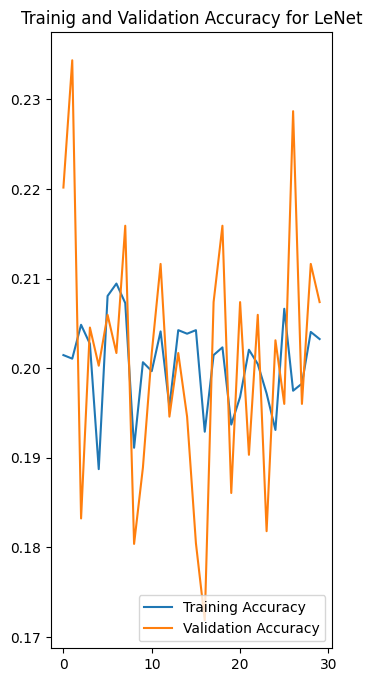

In [115]:
plt.figure(figsize=(8,8))
plt.subplot(1,2,1)
plt.plot(range(EPOCHS),acc_lenet, label='Training Accuracy')
plt.plot(range(EPOCHS), val_acc_lenet,label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Trainig and Validation Accuracy for LeNet')

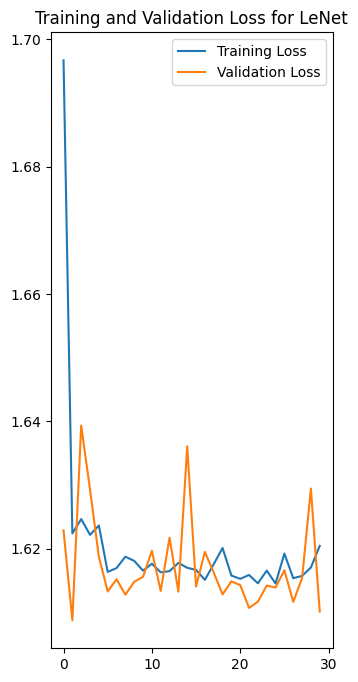

In [116]:
plt.figure(figsize=(8,8))

plt.subplot(1,2,2)
plt.plot(range(EPOCHS),loss_lenet, label="Training Loss")
plt.plot(range(EPOCHS),val_loss_lenet , label="Validation Loss")
plt.legend(loc='upper right')
plt.title("Training and Validation Loss for LeNet")
plt.show()

In [117]:
def prediction(lenet_model, img):
    img_array_1=tf.keras.preprocessing.image.img_to_array(images[i].numpy())
    img_array=tf.expand_dims(img_array_1,0) # create a batch 

    predictions=lenet_model.predict(img_array)

    predicted_class=class_names[np.argmax(predictions[0])]

    confidence=round(100*(np.max(predictions[0])),2)
    return predicted_class,confidence

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


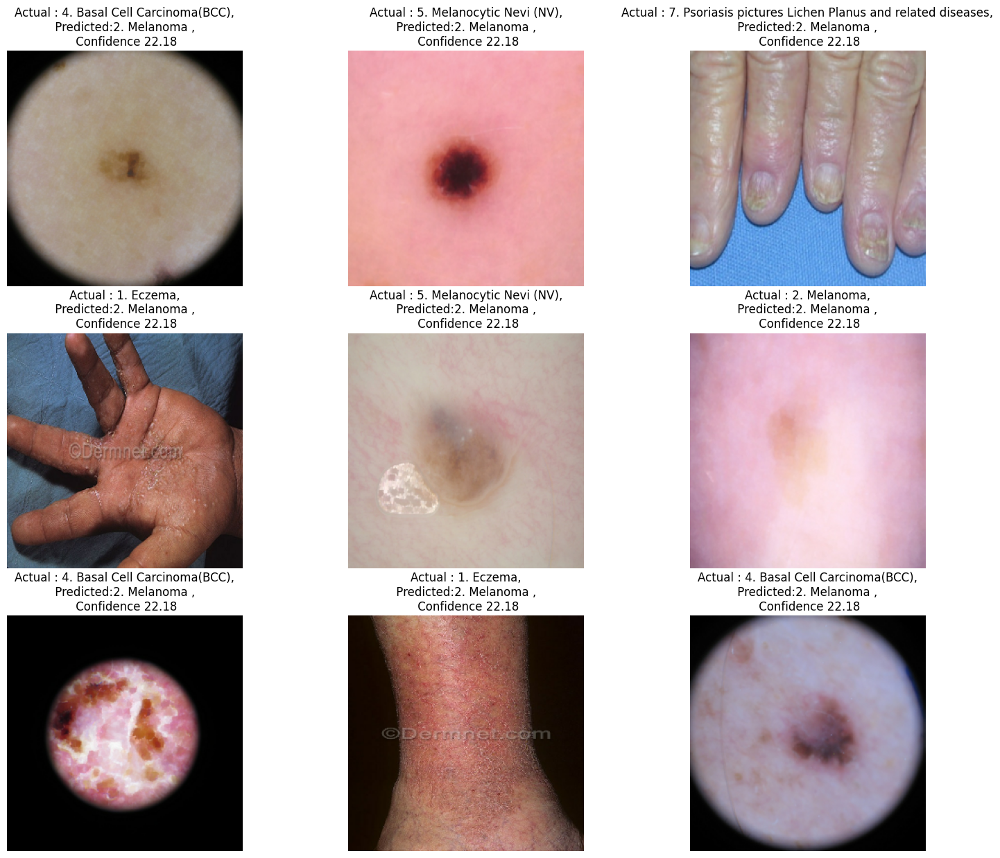

In [118]:
plt.figure(figsize=(18,15))
for images,labels in test_ds.take(1):
    for i in range(9): 
        ax=plt.subplot(3,3,i+1)
        plt.imshow(images[i].numpy().astype('uint8'))
        predicted_class,confidence=prediction(lenet_model,images[i].numpy())
        actual_class=class_names[labels[i]]
        plt.title(f"Actual : {actual_class},\n Predicted:{predicted_class} , \n Confidence {confidence}")
        plt.axis("off")

In [119]:
test_labels_lenet = []
predictions_lenet= []

for images, labels in test_ds:
    preds_lenet = lenet_model.predict(images)
    predictions_lenet.extend(preds_lenet)
    test_labels_lenet.extend(labels.numpy())

test_labels_lenet = np.array(test_labels_lenet)
predictions_lenet = np.array(predictions_lenet)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━

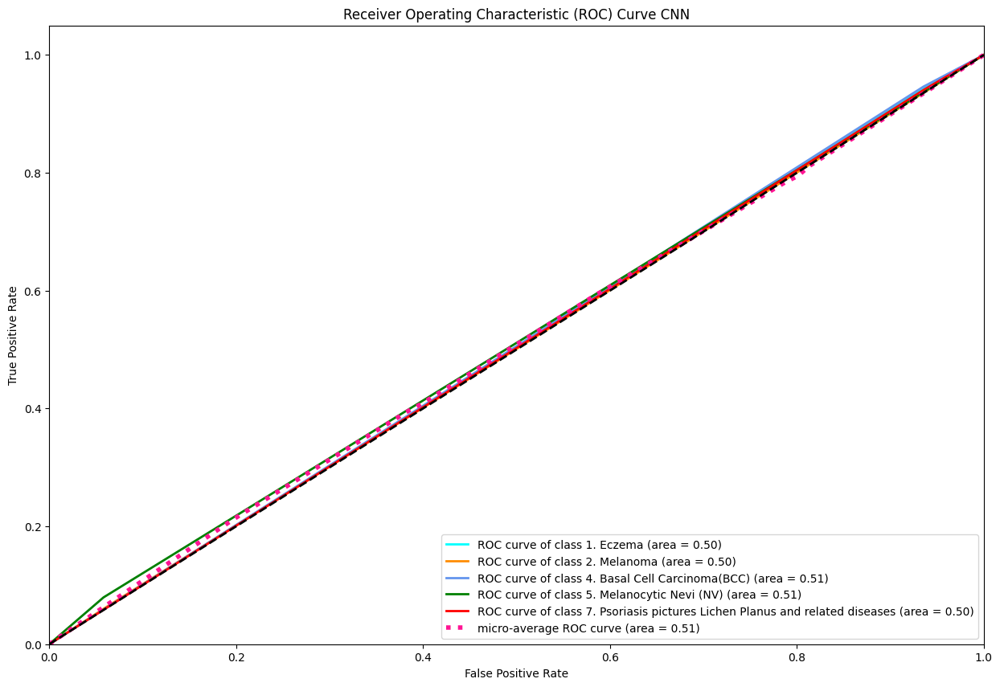

In [120]:
from itertools import cycle
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize


n_classes = len(class_names)
test_labels_binarized_lenet= label_binarize(test_labels_lenet, classes=range(n_classes))

fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(test_labels_binarized_lenet[:, i], predictions_lenet[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])


fpr["micro"], tpr["micro"], _ = roc_curve(test_labels_binarized_lenet.ravel(), predictions_lenet.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])


plt.figure(figsize=(15, 10))
colors = cycle(['aqua', 'darkorange', 'cornflowerblue', 'green', 'red'])

for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC curve of class {class_names[i]} (area = {roc_auc[i]:0.2f})')

plt.plot(fpr["micro"], tpr["micro"], color='deeppink', linestyle=':', linewidth=4,
         label=f'micro-average ROC curve (area = {roc_auc["micro"]:0.2f})')

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve CNN')
plt.legend(loc="lower right")
plt.show()

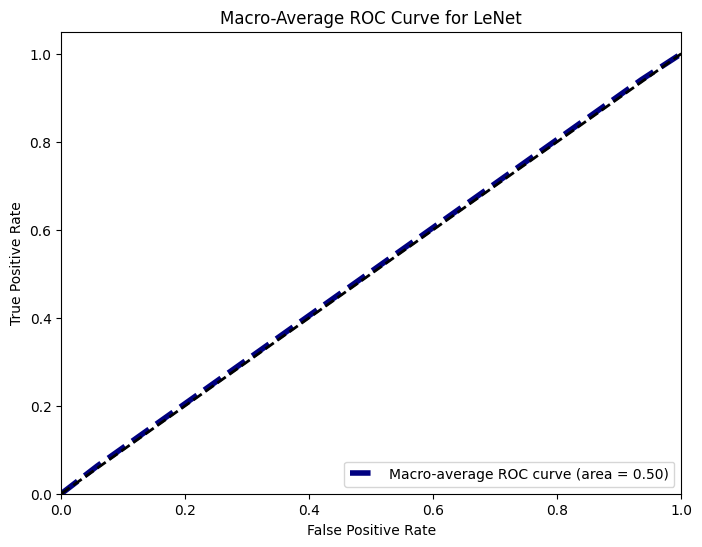

In [121]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt
import numpy as np

n_classes = len(class_names)
test_labels_binarized_lenet = label_binarize(test_labels_lenet, classes=range(n_classes))

fpr = dict()
tpr = dict()
roc_auc = dict()


for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(test_labels_binarized_lenet[:, i], predictions_lenet[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])


all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))
mean_tpr = np.zeros_like(all_fpr)

for i in range(n_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

mean_tpr /= n_classes

fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])


plt.figure(figsize=(8, 6))
plt.plot(fpr["macro"], tpr["macro"], color='navy', linestyle='--', linewidth=4,
         label=f'Macro-average ROC curve (area = {roc_auc["macro"]:0.2f})')

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Macro-Average ROC Curve for LeNet')
plt.legend(loc="lower right")
plt.show()


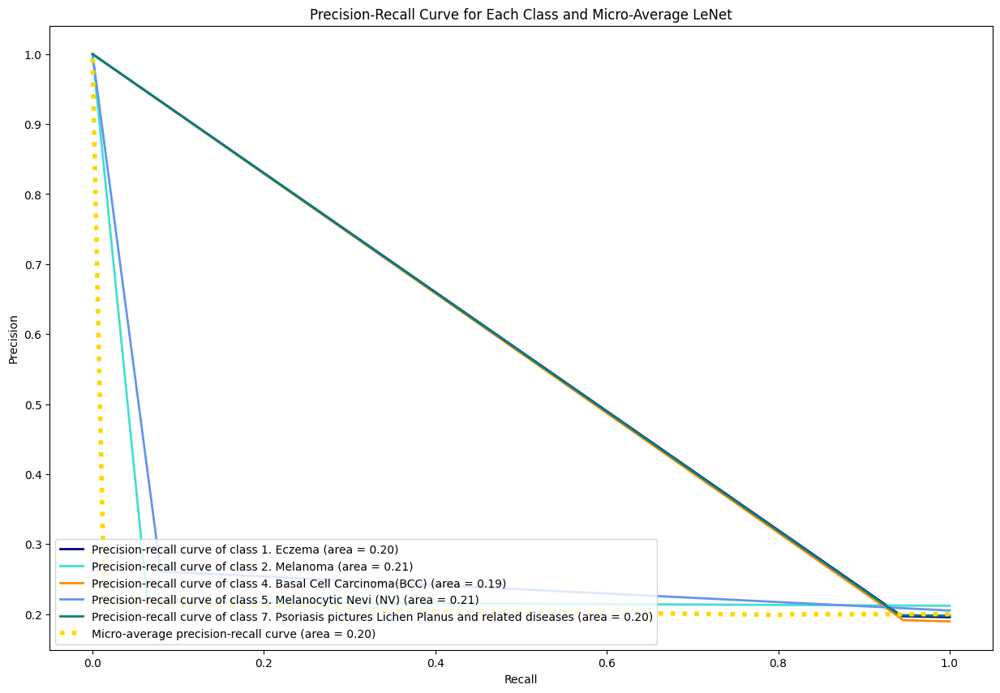

In [122]:
n_classes = len(class_names)
test_labels_binarized_lenet = label_binarize(test_labels_lenet, classes=range(n_classes))


precision = dict()
recall = dict()
average_precision = dict()
for i in range(n_classes):
    precision[i], recall[i], _ = precision_recall_curve(test_labels_binarized_lenet[:, i], predictions_lenet[:, i])
    average_precision[i] = average_precision_score(test_labels_binarized_lenet[:, i], predictions_lenet[:, i])

precision["micro"], recall["micro"], _ = precision_recall_curve(test_labels_binarized_lenet.ravel(), predictions_lenet.ravel())
average_precision["micro"] = average_precision_score(test_labels_binarized_lenet, predictions_lenet, average="micro")


plt.figure(figsize=(15, 10))
colors = cycle(['navy', 'turquoise', 'darkorange', 'cornflowerblue', 'teal'])

for i, color in zip(range(n_classes), colors):
    plt.plot(recall[i], precision[i], color=color, lw=2,
             label=f'Precision-recall curve of class {class_names[i]} (area = {average_precision[i]:0.2f})')

plt.plot(recall["micro"], precision["micro"], color='gold', linestyle=':', linewidth=4,
         label=f'Micro-average precision-recall curve (area = {average_precision["micro"]:0.2f})')

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve for Each Class and Micro-Average LeNet')
plt.legend(loc="lower left")
plt.show()

In [123]:
predicted_classes_lenet=np.argmax(predictions_lenet,axis=1)

In [124]:
from sklearn.metrics import f1_score, matthews_corrcoef


f1_scores = f1_score(test_labels_lenet, predicted_classes_lenet, average=None)


f1_score_macro = f1_score(test_labels_lenet, predicted_classes_lenet, average='macro')


print(f'F1 scores for each class CNN: {f1_scores}')
print(f'Macro-average F1 score CNN: {f1_score_macro}')


F1 scores for each class CNN: [0.         0.34977578 0.         0.         0.        ]
Macro-average F1 score CNN: 0.06995515695067264


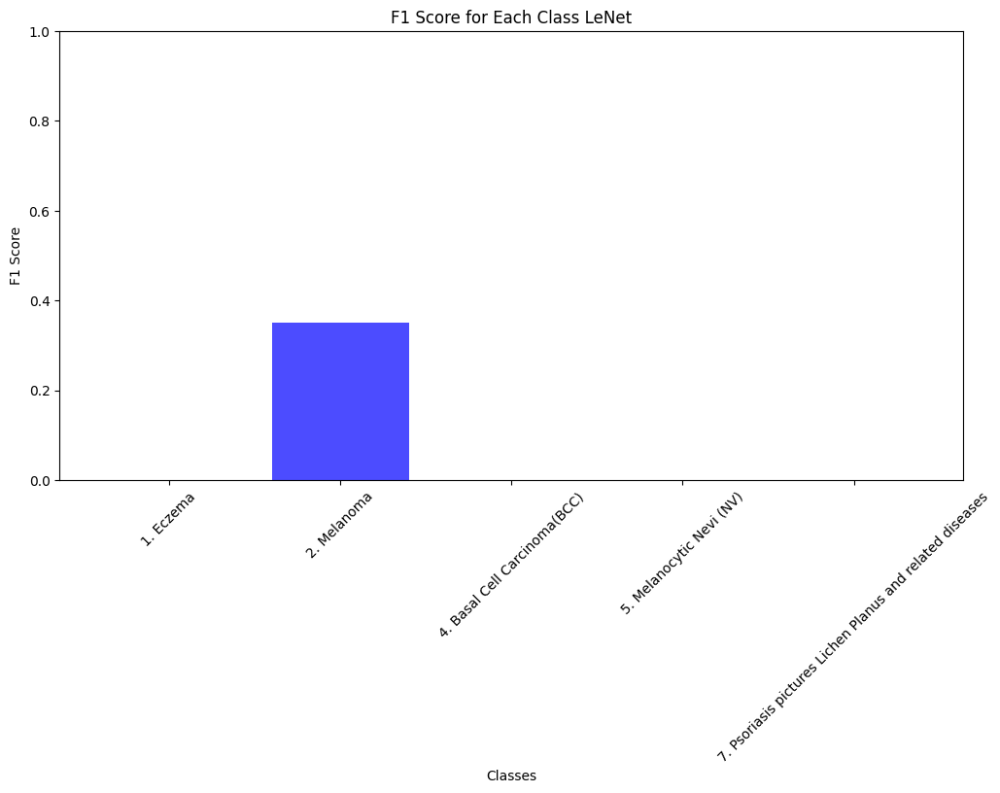

In [125]:
plt.figure(figsize=(12, 6))
plt.bar(np.arange(len(class_names)), f1_scores, color='b', alpha=0.7)
plt.xlabel('Classes')
plt.ylabel('F1 Score')
plt.title('F1 Score for Each Class LeNet')
plt.xticks(np.arange(len(class_names)), class_names, rotation=45)
plt.ylim(0, 1)
plt.show()

In [126]:
train_loss = history_lenet.history['loss']
val_loss = history_lenet.history['val_loss']
epochs = range(1, len(train_loss) + 1)

In [127]:
from sklearn.metrics import cohen_kappa_score
kappa = cohen_kappa_score(test_labels_lenet, predicted_classes_lenet)
print(f'Cohen\'s Kappa: {kappa:.4f}')

Cohen's Kappa: 0.0000


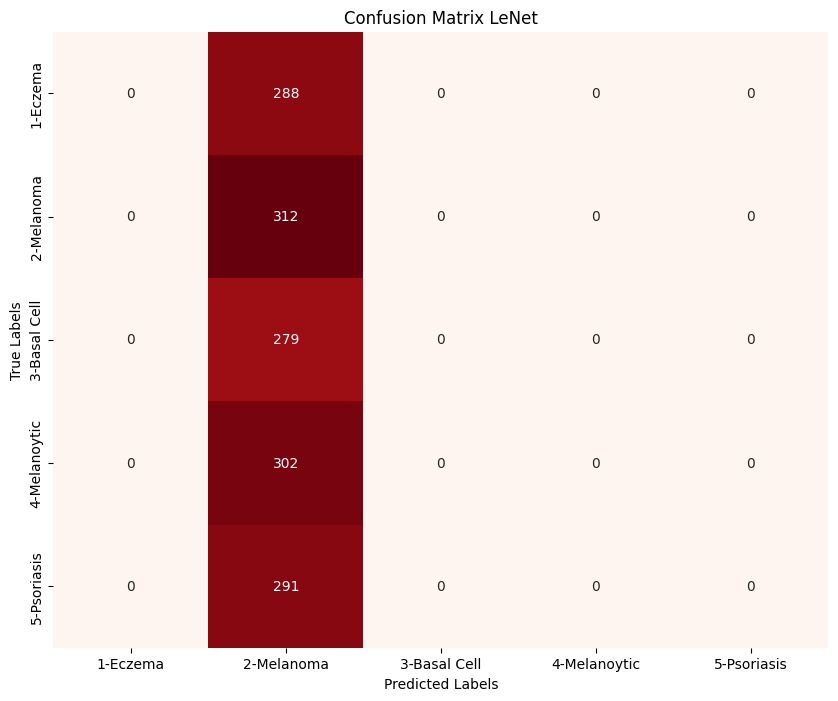

In [131]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

conf_matrix = confusion_matrix(test_labels_lenet, predicted_classes_lenet)

plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Reds', cbar=False)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix LeNet')


names=['1-Eczema','2-Melanoma','3-Basal Cell','4-Melanoytic','5-Psoriasis']
plt.xticks(ticks=np.arange(len(names))+0.5 , labels=names)
plt.yticks(ticks=np.arange(len(names))+0.5 , labels=names)
plt.show()

In [132]:
from sklearn.metrics import cohen_kappa_score

kappa_scores = []

for class_idx in range(len(class_names)):
    true_class_labels = (test_labels_lenet == class_idx)
    pred_class_labels = (predicted_classes_lenet == class_idx)
    
    kappa = cohen_kappa_score(true_class_labels, pred_class_labels)
    kappa_scores.append(kappa)


for class_idx, class_name in enumerate(class_names):
    sum=0
    print(f'Cohen\'s Kappa for class "{class_name}": {kappa_scores[class_idx]:.4f}')
    sum+=kappa_scores[class_idx]
print(" the average of the kapp scores ",sum/5)

Cohen's Kappa for class "1. Eczema": 0.0000
Cohen's Kappa for class "2. Melanoma": 0.0000
Cohen's Kappa for class "4. Basal Cell Carcinoma(BCC)": 0.0000
Cohen's Kappa for class "5. Melanocytic Nevi (NV)": 0.0000
Cohen's Kappa for class "7. Psoriasis pictures Lichen Planus and related diseases": 0.0000
 the average of the kapp scores  0.0


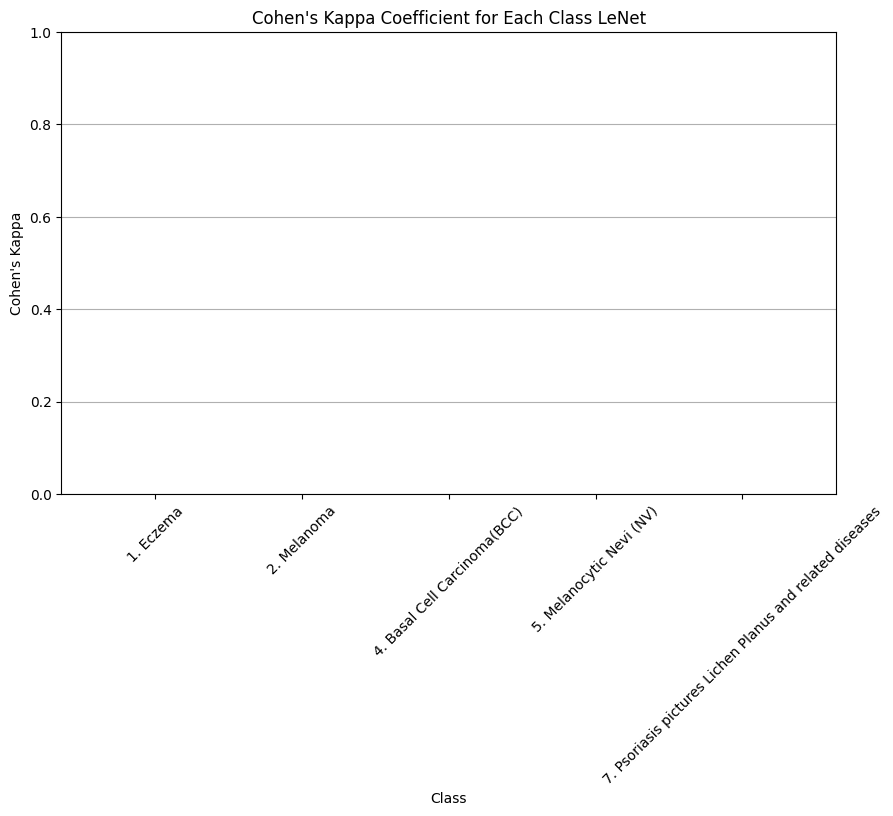

In [133]:
plt.figure(figsize=(10, 6))
plt.bar(class_names, kappa_scores, color='purple')
plt.xlabel('Class')
plt.ylabel('Cohen\'s Kappa')
plt.title('Cohen\'s Kappa Coefficient for Each Class LeNet')
plt.ylim(0, 1)  
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.show()


<h1>Comparition of different methods</h1>

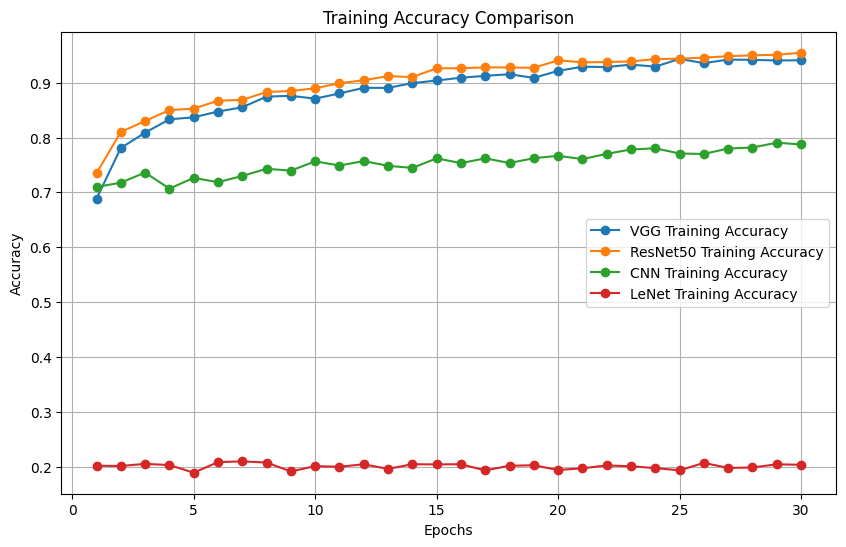

In [134]:
vgg_accuracy = history_vgg.history['accuracy']
resnet_accuracy = history_resnet.history['accuracy']
cnn_accuracy = history_cnn.history['accuracy']
lenet_accuracy=history_lenet.history['accuracy']

epochs = range(1, len(vgg_accuracy) + 1)

plt.figure(figsize=(10, 6))
plt.plot(epochs, vgg_accuracy,'o-', label='VGG Training Accuracy')
plt.plot(epochs, resnet_accuracy,'o-', label='ResNet50 Training Accuracy')
plt.plot(epochs, cnn_accuracy, 'o-',label='CNN Training Accuracy')
plt.plot(epochs, lenet_accuracy ,'o-',label='LeNet Training Accuracy')

plt.title('Training Accuracy Comparison')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.show()

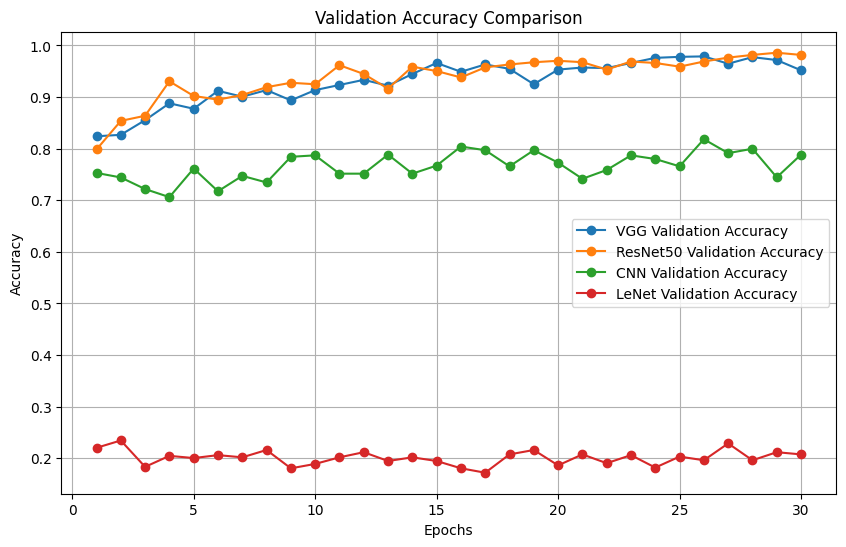

In [135]:
vgg_val_accuracy = history_vgg.history['val_accuracy']
resnet_val_accuracy = history_resnet.history['val_accuracy']
cnn_val_accuracy = history_cnn.history['val_accuracy']
lenet_val_accuracy=history_lenet.history['val_accuracy']


plt.figure(figsize=(10, 6))
plt.plot(epochs, vgg_val_accuracy,'o-', label='VGG Validation Accuracy')
plt.plot(epochs, resnet_val_accuracy,'o-', label='ResNet50 Validation Accuracy')
plt.plot(epochs, cnn_val_accuracy, 'o-',label='CNN Validation Accuracy')
plt.plot(epochs, lenet_val_accuracy , 'o-', label="LeNet Validation Accuracy")

plt.title('Validation Accuracy Comparison')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.show()

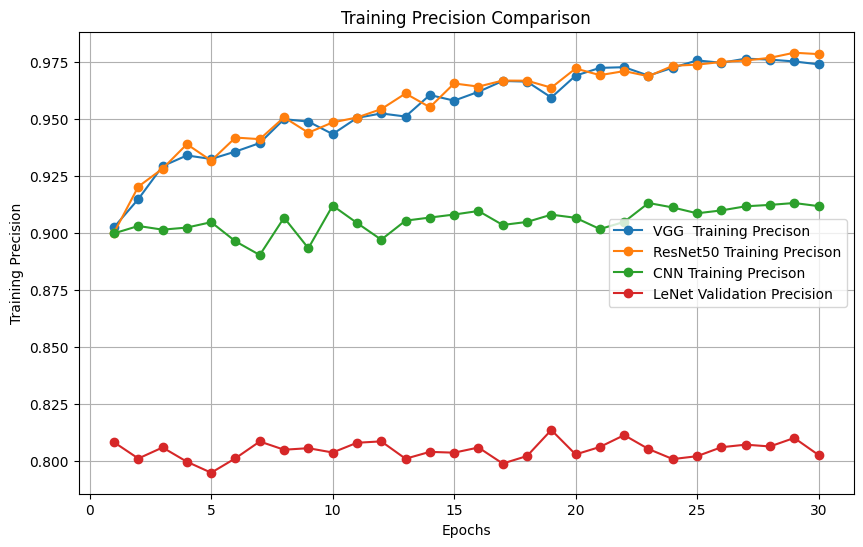

In [136]:
vgg_precision = history_vgg.history['precision']
resnet_precision= history_resnet.history['precision']
cnn_precision = history_cnn.history['precision']
lenet_precision=history_lenet.history['precision']


plt.figure(figsize=(10, 6))
plt.plot(epochs,vgg_precision  ,'o-', label='VGG  Training Precison')
plt.plot(epochs, resnet_precision,'o-', label='ResNet50 Training Precison')
plt.plot(epochs, cnn_precision,'o-', label='CNN Training Precison')
plt.plot(epochs,lenet_precision , 'o-',label="LeNet Validation Precision")

plt.title('Training Precision Comparison')
plt.xlabel('Epochs')
plt.ylabel('Training Precision')
plt.legend()
plt.grid(True)
plt.show()

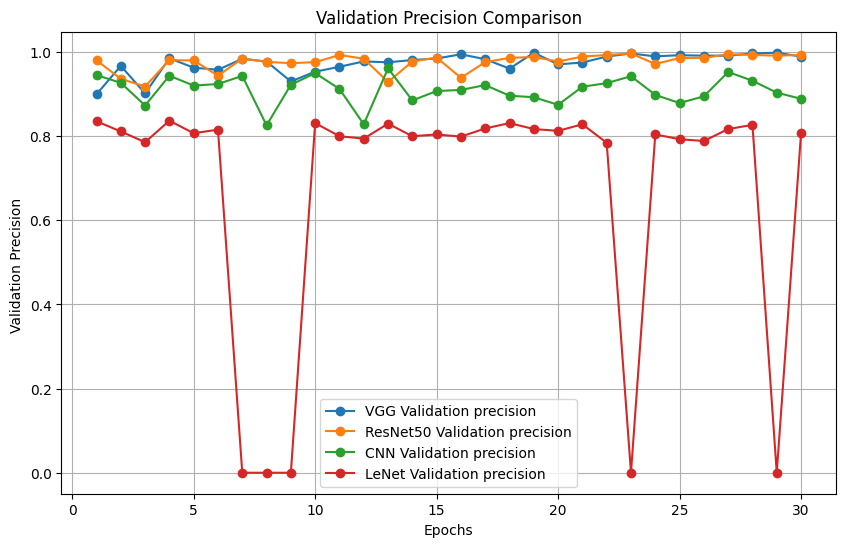

In [137]:
vgg_val_precision = history_vgg.history['val_precision']
resnet_val_precision = history_resnet.history['val_precision']
cnn_val_precision = history_cnn.history['val_precision']
lenet_val_precision=history_lenet.history['val_precision']


plt.figure(figsize=(10, 6))
plt.plot(epochs, vgg_val_precision, 'o-',label='VGG Validation precision')
plt.plot(epochs, resnet_val_precision,'o-', label='ResNet50 Validation precision')
plt.plot(epochs, cnn_val_precision,'o-', label='CNN Validation precision')
plt.plot(epochs , lenet_val_precision , 'o-',label="LeNet Validation precision")

plt.title('Validation Precision Comparison')
plt.xlabel('Epochs')
plt.ylabel('Validation Precision ')
plt.legend()
plt.grid(True)
plt.show()

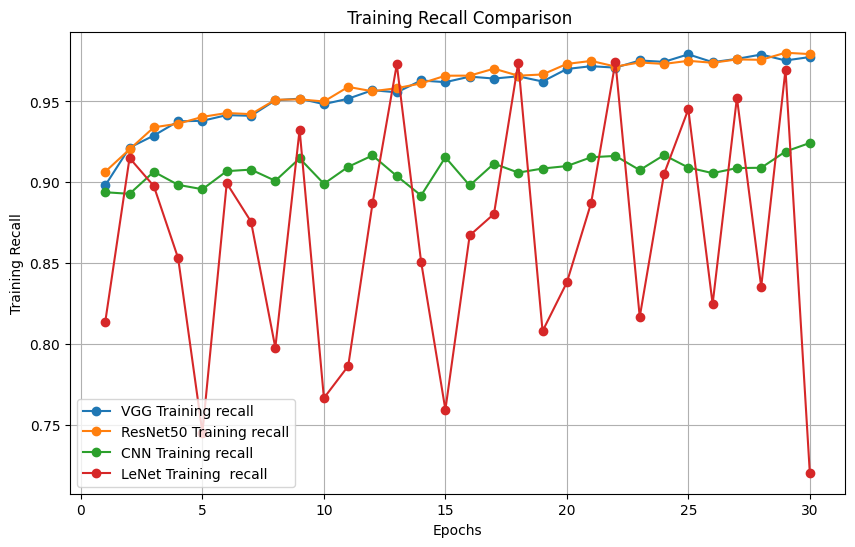

In [138]:
vgg_recall = history_vgg.history['recall']
resnet_recall= history_resnet.history['recall']
cnn_recall = history_cnn.history['recall']
lenet_recall=history_lenet.history['recall']


plt.figure(figsize=(10, 6))
plt.plot(epochs,vgg_recall  ,'o-', label='VGG Training recall')
plt.plot(epochs, resnet_recall, 'o-',label='ResNet50 Training recall')
plt.plot(epochs, cnn_recall, 'o-',label='CNN Training recall')
plt.plot(epochs, lenet_recall ,'o-',label="LeNet Training  recall")

plt.title(' Training Recall Comparison')
plt.xlabel('Epochs')
plt.ylabel('Training Recall')
plt.legend()
plt.grid(True)
plt.show()

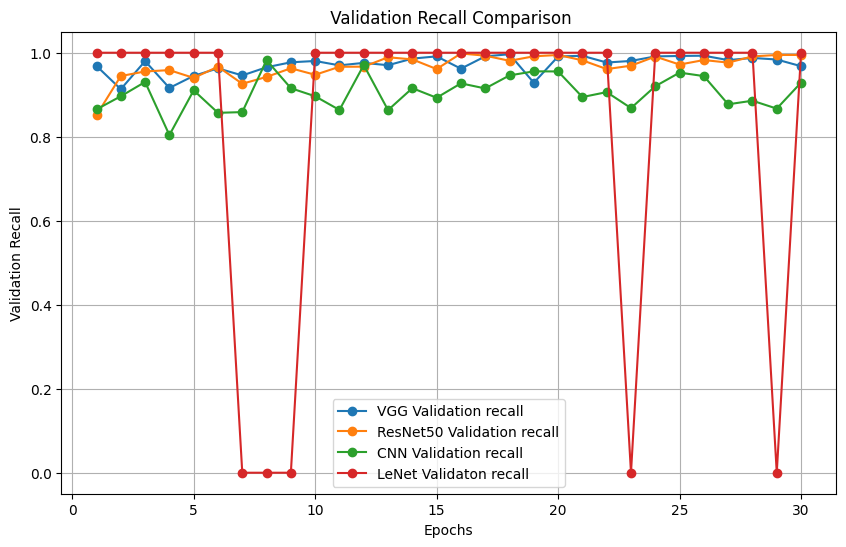

In [139]:
vgg_validation_recall = history_vgg.history['val_recall']
resnet_validation_recall= history_resnet.history['val_recall']
cnn_validation_recall = history_cnn.history['val_recall']
lenet_validation_recall=history_lenet.history['val_recall']


plt.figure(figsize=(10, 6))
plt.plot(epochs,vgg_validation_recall  ,'o-', label='VGG Validation recall')
plt.plot(epochs, resnet_validation_recall, 'o-',label='ResNet50 Validation recall')
plt.plot(epochs, cnn_validation_recall,'o-', label='CNN Validation recall')
plt.plot(epochs , lenet_validation_recall , 'o-', label="LeNet Validaton recall")

plt.title(' Validation Recall Comparison')
plt.xlabel('Epochs')
plt.ylabel('Validation Recall')
plt.legend()
plt.grid(True)
plt.show()

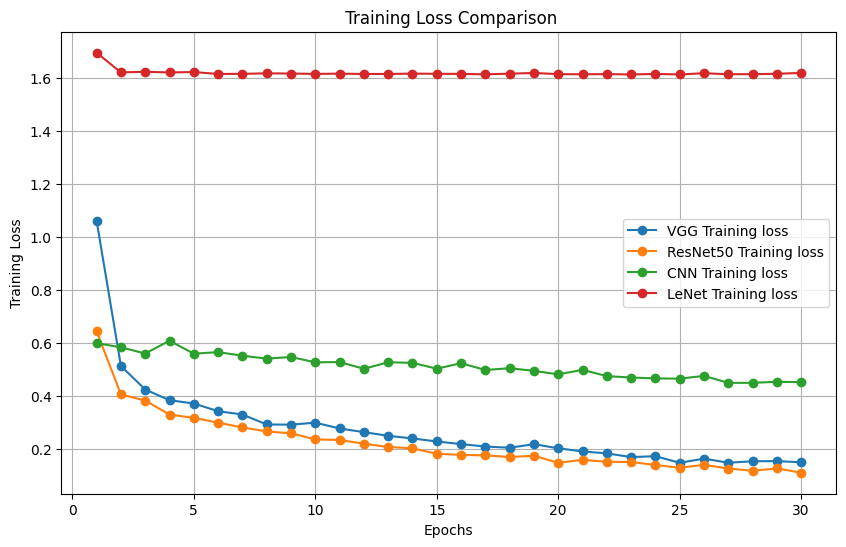

In [140]:
vgg_loss = history_vgg.history['loss']
resnet_loss= history_resnet.history['loss']
cnn_loss= history_cnn.history['loss']
lenet_loss=history_lenet.history['loss']


plt.figure(figsize=(10, 6))
plt.plot(epochs,vgg_loss  , 'o-',label='VGG Training loss')
plt.plot(epochs, resnet_loss, 'o-',label='ResNet50 Training loss')
plt.plot(epochs, cnn_loss, 'o-',label='CNN Training loss')
plt.plot(epochs,lenet_loss,'o-', label="LeNet Training loss")

plt.title(' Training Loss Comparison')
plt.xlabel('Epochs')
plt.ylabel('Training Loss')
plt.legend()
plt.grid(True)
plt.show()

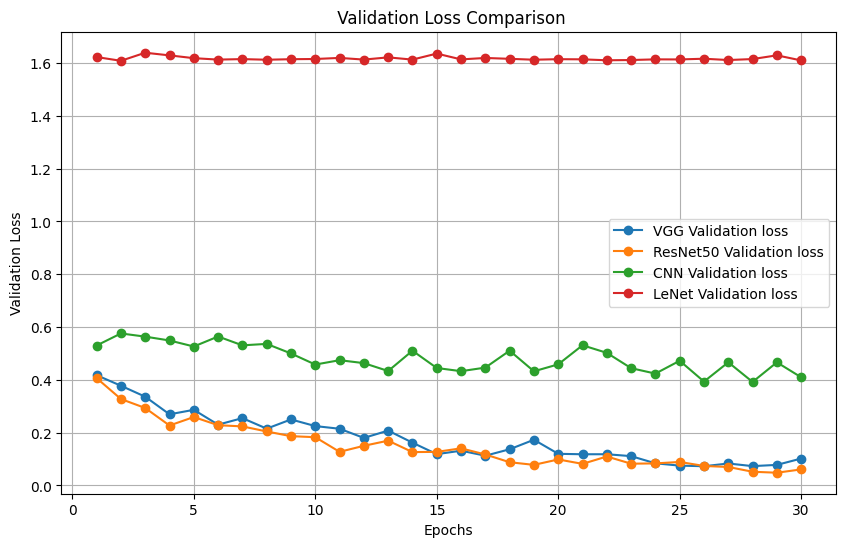

In [141]:
vgg_val_loss = history_vgg.history['val_loss']
resnet_val_loss= history_resnet.history['val_loss']
cnn_val_loss= history_cnn.history['val_loss']
lenet_val_loss=history_lenet.history['val_loss']


plt.figure(figsize=(10, 6))
plt.plot(epochs,vgg_val_loss  , 'o-',label='VGG Validation loss')
plt.plot(epochs, resnet_val_loss, 'o-',label='ResNet50 Validation loss')
plt.plot(epochs, cnn_val_loss, 'o-',label='CNN Validation loss')
plt.plot(epochs, lenet_val_loss , 'o-',label="LeNet Validation loss")

plt.title(' Validation Loss Comparison')
plt.xlabel('Epochs')
plt.ylabel('Validation Loss')
plt.legend()
plt.grid(True)
plt.show()

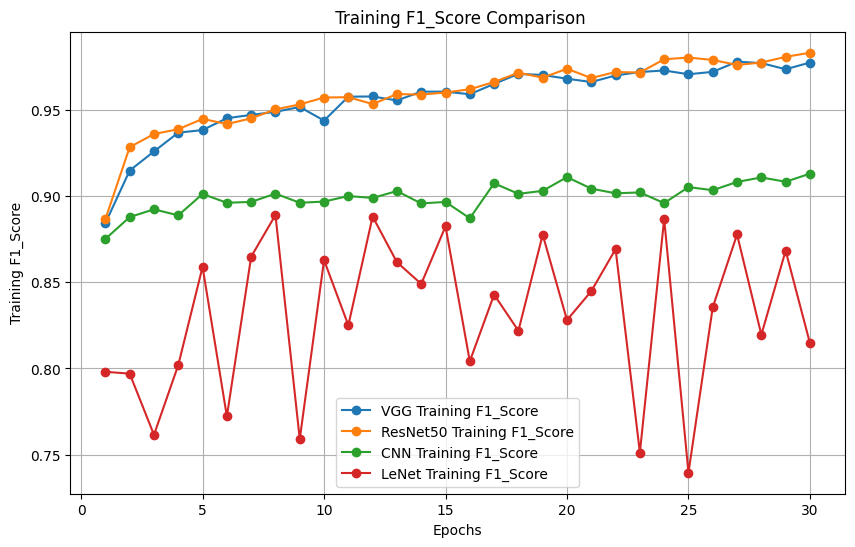

In [142]:
cnn_f1_score = [0.8752 , 0.8879 ,0.8924 ,0.8889 ,0.9013  ,0.8962 ,0.8967 ,0.9015 ,0.8962 ,0.8969 ,0.9001 ,0.8990 ,0.9030 ,0.8958 ,0.8967 ,0.8872
,0.9075 ,0.9014 ,0.9031 ,0.9111 ,0.9044 ,0.9017 ,0.9022 ,0.8960 ,0.9053 ,0.9035 ,0.9083 ,0.9109 ,0.9084 ,0.9131]
vgg_f1_score= [0.8844 ,0.9149 , 0.9260 ,0.9369 ,0.9384 ,0.9453 ,0.9472 ,0.9490 ,0.9518 ,0.9439 ,0.9578 ,0.9579 ,0.9556 ,0.9607 ,0.9607 ,0.9592,
0.9652 ,0.9710 ,0.9704 ,0.9682 ,0.9663 ,0.9701 ,0.9721 ,0.9730 ,0.9708 ,0.9722,0.9781 ,0.9773 ,0.9737 ,0.9776]
resnet_f1_score= [0.8867 , 0.9285 ,0.9361 ,0.9389 ,0.9449 ,0.9419 ,0.9452 ,0.9504 ,0.9533 ,0.9573 ,0.9575 ,0.9535 ,0.9593 ,0.9590 ,0.9602 ,0.9621 ,0.9663 ,0.9717 ,0.9688 ,0.9740 ,0.9686 ,0.9721 ,0.9718 ,0.9795 ,0.9805 ,0.9791,0.9762 ,0.9776 ,0.9809 ,0.9833]
lenet_f1_score=[0.7981 ,0.7970 ,0.7615 ,0.8020 ,0.8590 ,0.7722  ,0.8649 ,0.8891 ,0.7590 ,0.8629 ,0.8251 ,0.8882 ,0.8617 ,0.8491,0.8825,0.8042,
0.8429, 0.8219, 0.8777 ,0.8281 ,0.8449 ,0.8693 ,0.7512 ,0.8868 ,0.7395 ,0.8356 ,0.8778 ,0.8196 ,0.8684 ,0.8147]


plt.figure(figsize=(10, 6))
plt.plot(epochs,vgg_f1_score  , 'o-',label='VGG Training F1_Score')
plt.plot(epochs, resnet_f1_score, 'o-',label='ResNet50 Training F1_Score')
plt.plot(epochs, cnn_f1_score, 'o-',label='CNN Training F1_Score')
plt.plot(epochs,lenet_f1_score,'o-', label="LeNet Training F1_Score")

plt.title(' Training F1_Score Comparison')
plt.xlabel('Epochs')
plt.ylabel('Training F1_Score')
plt.legend()
plt.grid(True)
plt.show()

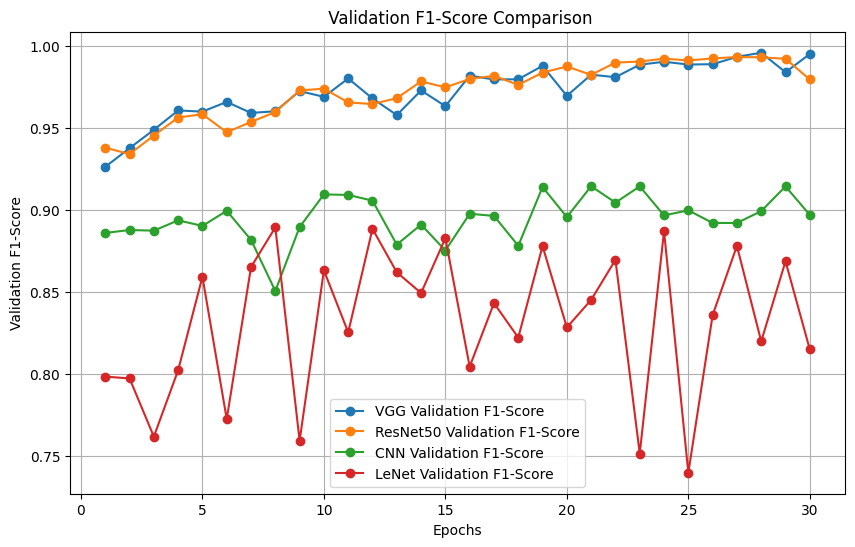

In [164]:
cnn_val_f1_score = [0.8857,0.8875,0.8871 ,0.8934 ,0.8900 ,0.8992 ,0.8815,0.8503,0.8893,0.9092,0.9089,0.9054,0.8786,0.8908,0.8750,
0.8974,0.8961,0.8779,0.9137,0.8954,0.9142,0.9042,0.9141,0.8964,0.8995,0.8918,0.8918,0.8990,0.9141,0.8967]
vgg_val_f1_score= [0.9260,0.9374,0.9486,0.9604,0.9597,0.9656 ,0.9589,0.9599,0.9722,0.9687,0.9799,0.9677,0.9576,0.9726,0.9630,0.9816,0.9793,
0.9794,0.9876,0.9693,0.9822,0.9807,0.9883,0.9901,0.9884,0.9886,0.9931,0.9956,0.9837,0.9948]
resnet_val_f1_score= [0.9377,0.9338,0.9451,0.9561,0.9581,0.9471,0.9534,0.9594,0.9726,0.9737,0.9653,0.9643,0.9679,0.9781,0.9745,0.9796,0.9815,
0.9760,0.9835,0.9872,0.9821,0.9896,0.9902,0.9920,0.9909,0.9921,0.9930,0.9928,0.9919,0.9793]
lenet_val_f1_score=[0.7981,0.7970,0.7615,0.8020,0.8590,0.7722,0.8649,0.8891,0.7590,0.8629,0.8251,0.8882,0.8617,0.8491,0.8825,0.8042,0.8429,
0.8219, 0.8777,0.8281,0.8449,0.8693,0.7512,0.8868,0.7395,0.8356,0.8778,0.8196,0.8684,0.8147]


plt.figure(figsize=(10, 6))
plt.plot(epochs,vgg_val_f1_score  , 'o-',label='VGG Validation F1-Score')
plt.plot(epochs, resnet_val_f1_score, 'o-',label='ResNet50 Validation F1-Score')
plt.plot(epochs, cnn_val_f1_score, 'o-',label='CNN Validation F1-Score')
plt.plot(epochs,lenet_val_f1_score,'o-', label="LeNet Validation F1-Score")

plt.title(' Validation F1-Score Comparison')
plt.xlabel('Epochs')
plt.ylabel('Validation F1-Score')
plt.legend()
plt.grid(True)
plt.show()

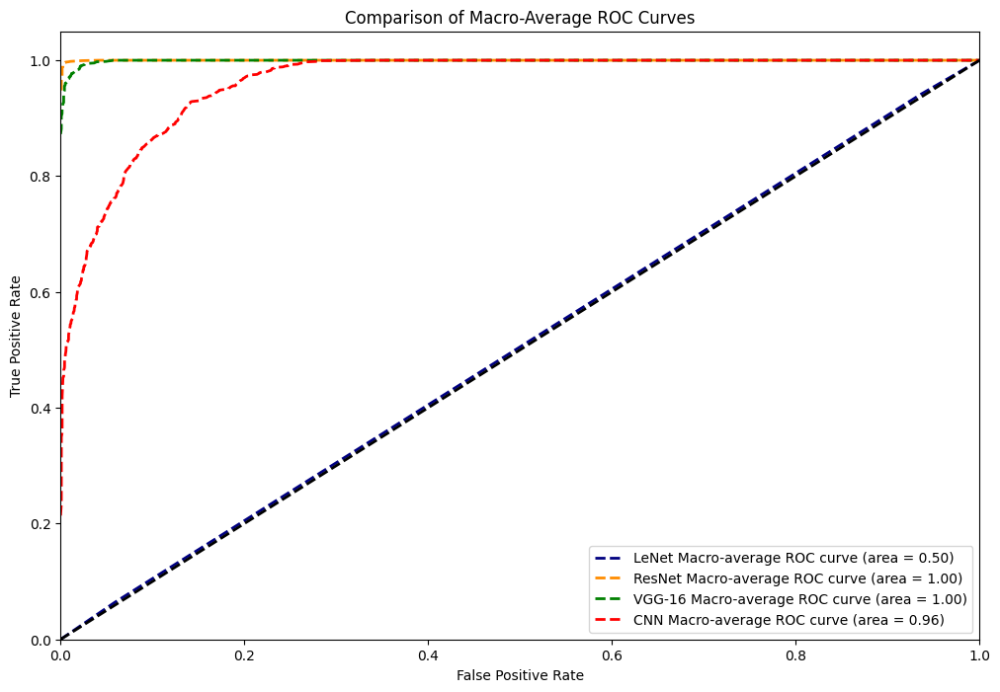

In [144]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize



n_classes = len(class_names)

def calculate_roc_auc(test_labels, predictions, n_classes):
    test_labels_binarized = label_binarize(test_labels, classes=range(n_classes))
    fpr = dict()
    tpr = dict()
    roc_auc = dict()

    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(test_labels_binarized[:, i], predictions[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))
    mean_tpr = np.zeros_like(all_fpr)

    for i in range(n_classes):
        mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

    mean_tpr /= n_classes
    roc_auc["macro"] = auc(all_fpr, mean_tpr)
    
    return all_fpr, mean_tpr, roc_auc["macro"]

fpr_lenet, tpr_lenet, roc_auc_macro_lenet = calculate_roc_auc(test_labels_lenet, predictions_lenet, n_classes)
fpr_resnet, tpr_resnet, roc_auc_macro_resnet = calculate_roc_auc(test_labels_resnet, predictions_resnet, n_classes)
fpr_vgg, tpr_vgg, roc_auc_macro_vgg = calculate_roc_auc(test_labels_vgg, predictions_vgg, n_classes)
fpr_cnn, tpr_cnn, roc_auc_macro_cnn = calculate_roc_auc(test_labels_cnn, predictions_cnn, n_classes)

plt.figure(figsize=(12, 8))

plt.plot(fpr_lenet, tpr_lenet, color='navy', linestyle='--', linewidth=2,
         label=f'LeNet Macro-average ROC curve (area = {roc_auc_macro_lenet:0.2f})')
plt.plot(fpr_resnet, tpr_resnet, color='darkorange', linestyle='--', linewidth=2,
         label=f'ResNet Macro-average ROC curve (area = {roc_auc_macro_resnet:0.2f})')
plt.plot(fpr_vgg, tpr_vgg, color='green', linestyle='--', linewidth=2,
         label=f'VGG-16 Macro-average ROC curve (area = {roc_auc_macro_vgg:0.2f})')
plt.plot(fpr_cnn, tpr_cnn, color='red', linestyle='--', linewidth=2,
         label=f'CNN Macro-average ROC curve (area = {roc_auc_macro_cnn:0.2f})')

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Comparison of Macro-Average ROC Curves')
plt.legend(loc="lower right")
plt.show()

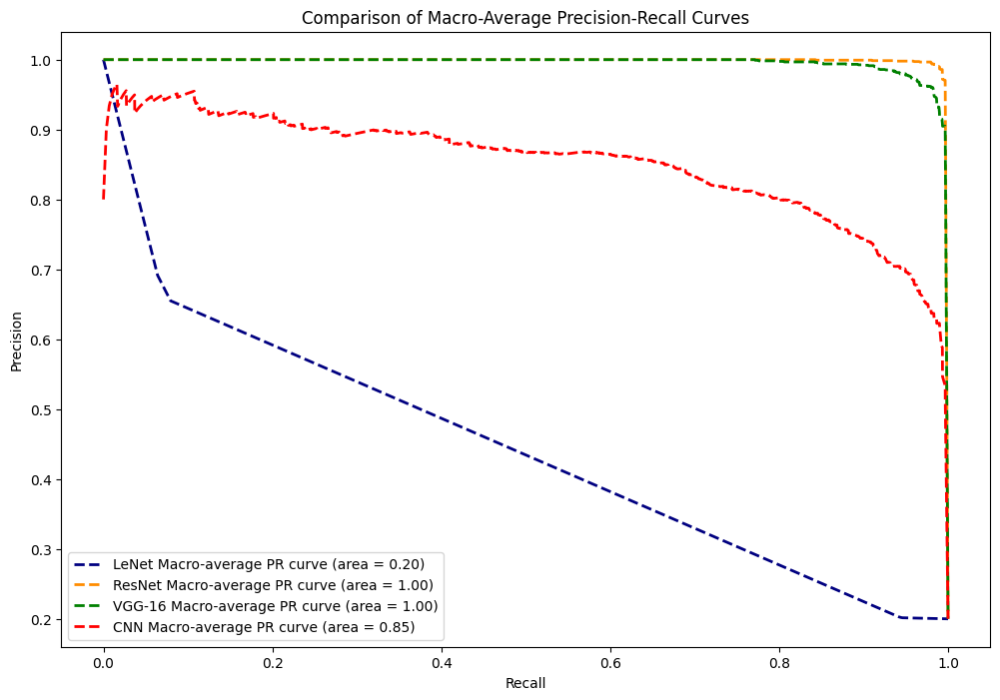

In [145]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import precision_recall_curve, average_precision_score
from sklearn.preprocessing import label_binarize



n_classes = len(class_names)

def calculate_precision_recall(test_labels, predictions, n_classes):
    test_labels_binarized = label_binarize(test_labels, classes=range(n_classes))
    precision = dict()
    recall = dict()
    average_precision = dict()

    for i in range(n_classes):
        precision[i], recall[i], _ = precision_recall_curve(test_labels_binarized[:, i], predictions[:, i])
        average_precision[i] = average_precision_score(test_labels_binarized[:, i], predictions[:, i])

    all_recall = np.unique(np.concatenate([recall[i] for i in range(n_classes)]))
    mean_precision = np.zeros_like(all_recall)

    for i in range(n_classes):
        mean_precision += np.interp(all_recall, recall[i][::-1], precision[i][::-1])

    mean_precision /= n_classes
    average_precision["macro"] = average_precision_score(test_labels_binarized, predictions, average="macro")
    
    return all_recall, mean_precision, average_precision["macro"]

recall_lenet, precision_lenet, avg_precision_macro_lenet = calculate_precision_recall(test_labels_lenet, predictions_lenet, n_classes)
recall_resnet, precision_resnet, avg_precision_macro_resnet = calculate_precision_recall(test_labels_resnet, predictions_resnet, n_classes)
recall_vgg, precision_vgg, avg_precision_macro_vgg = calculate_precision_recall(test_labels_vgg, predictions_vgg, n_classes)
recall_cnn, precision_cnn, avg_precision_macro_cnn = calculate_precision_recall(test_labels_cnn, predictions_cnn, n_classes)

plt.figure(figsize=(12, 8))

plt.plot(recall_lenet, precision_lenet, color='navy', linestyle='--', linewidth=2,
         label=f'LeNet Macro-average PR curve (area = {avg_precision_macro_lenet:0.2f})')
plt.plot(recall_resnet, precision_resnet, color='darkorange', linestyle='--', linewidth=2,
         label=f'ResNet Macro-average PR curve (area = {avg_precision_macro_resnet:0.2f})')
plt.plot(recall_vgg, precision_vgg, color='green', linestyle='--', linewidth=2,
         label=f'VGG-16 Macro-average PR curve (area = {avg_precision_macro_vgg:0.2f})')
plt.plot(recall_cnn, precision_cnn, color='red', linestyle='--', linewidth=2,
         label=f'CNN Macro-average PR curve (area = {avg_precision_macro_cnn:0.2f})')

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Comparison of Macro-Average Precision-Recall Curves')
plt.legend(loc="lower left")
plt.show()


In [151]:
scores_cnn[0]=model_cnn.evaluate(test_ds)



46/46 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step - accuracy: 0.7728 - f1_score: 0.9065 - loss: 0.4476 - precision: 0.8705 - recall: 0.9460


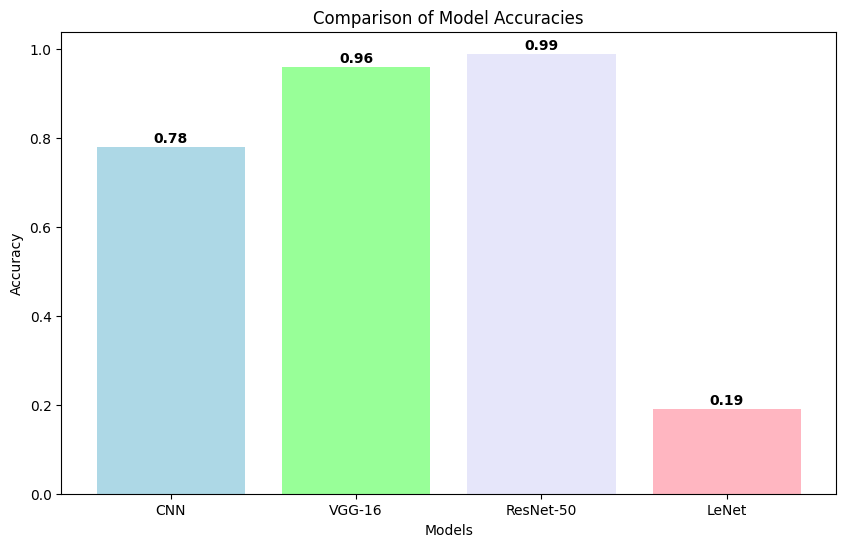

In [174]:
accuracy_cnn = 0.78
accuracy_vgg = 0.96
accuracy_resnet = 0.99
accuracy_lenet = 0.19


models = ['CNN', 'VGG-16', 'ResNet-50', 'LeNet']
accuracies = [accuracy_cnn, accuracy_vgg, accuracy_resnet, accuracy_lenet]


plt.figure(figsize=(10, 6))
plt.bar(models, accuracies, color=['#ADD8E6', '#98FF98', '#E6E6FA', '#FFB6C1'])


plt.title('Comparison of Model Accuracies')
plt.xlabel('Models')
plt.ylabel('Accuracy')


for i, v in enumerate(accuracies):
    plt.text(i, v + 0.01, str(v), ha='center', fontweight='bold')


plt.show()


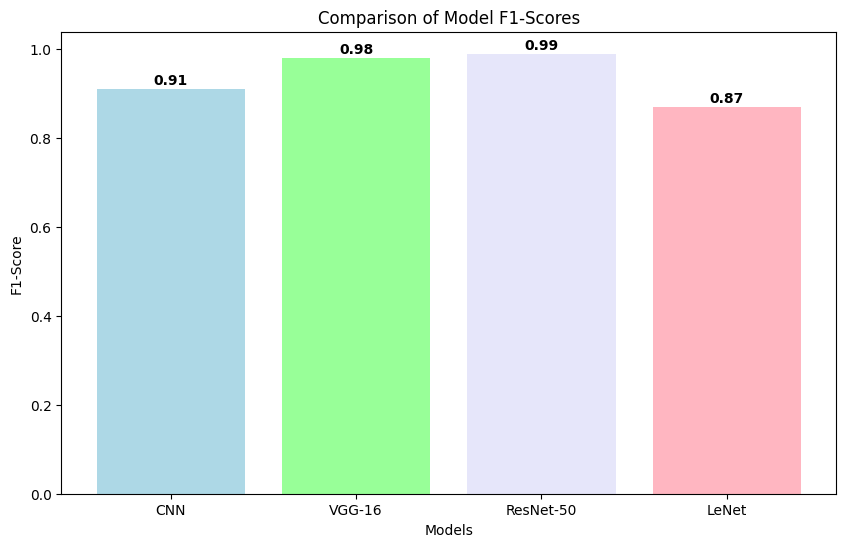

In [173]:
f1score_cnn = 0.91
f1score_vgg = 0.98
f1score_resnet = 0.99
f1score_lenet = 0.87


models = ['CNN', 'VGG-16', 'ResNet-50', 'LeNet']
accuracies = [f1score_cnn, f1score_vgg, f1score_resnet, f1score_lenet]


plt.figure(figsize=(10, 6))
plt.bar(models, accuracies, color=['#ADD8E6', '#98FF98', '#E6E6FA', '#FFB6C1'])


plt.title('Comparison of Model F1-Scores')
plt.xlabel('Models')
plt.ylabel('F1-Score')


for i, v in enumerate(accuracies):
    plt.text(i, v + 0.01, str(v), ha='center', fontweight='bold')


plt.show()

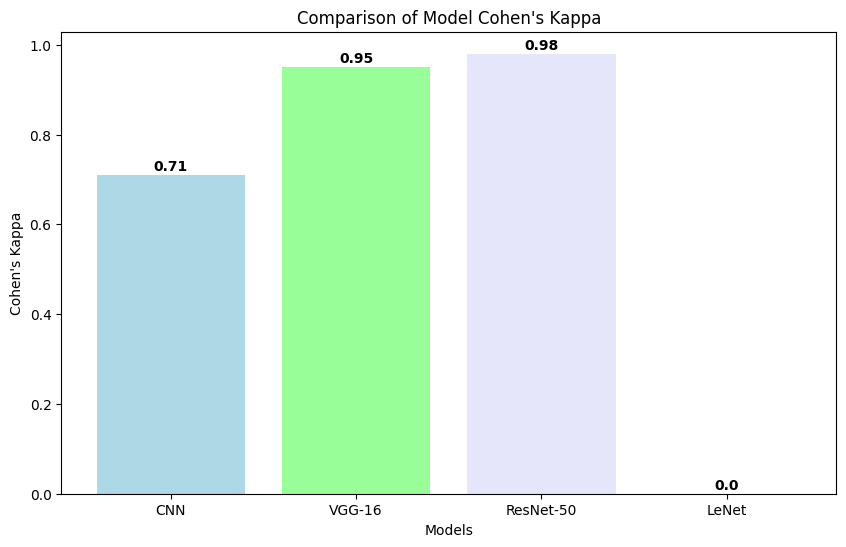

In [171]:
kappa_cnn = 0.71
kappa_vgg = 0.95
kappa_resnet = 0.98
kappa_lenet = 0.0


models = ['CNN', 'VGG-16', 'ResNet-50', 'LeNet']
accuracies = [kappa_cnn, kappa_vgg, kappa_resnet, kappa_lenet]


plt.figure(figsize=(10, 6))
plt.bar(models, accuracies, color=['#ADD8E6', '#98FF98', '#E6E6FA', '#FFB6C1'])


plt.title("Comparison of Model Cohen's Kappa")
plt.xlabel('Models')
plt.ylabel("Cohen's Kappa")


for i, v in enumerate(accuracies):
    plt.text(i, v + 0.01, str(v), ha='center', fontweight='bold')


plt.show()

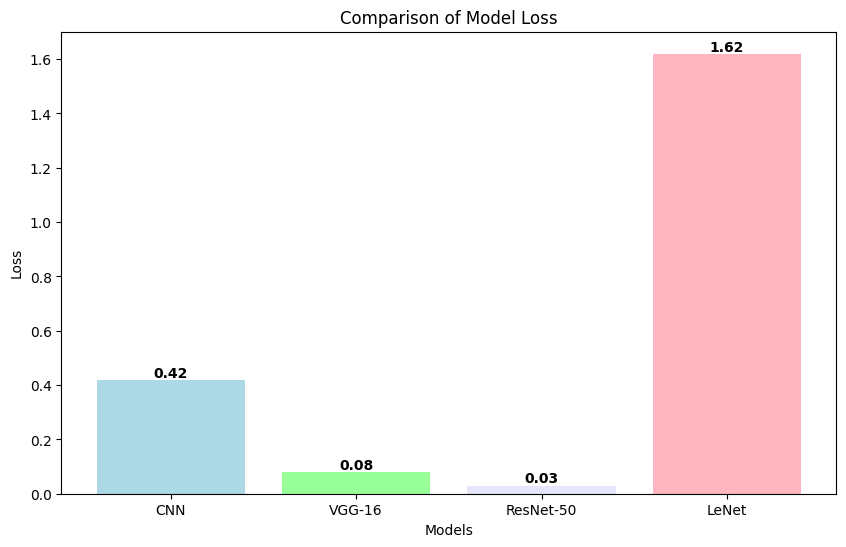

In [175]:
loss_cnn = 0.42
loss_vgg = 0.08
loss_resnet = 0.03
loss_lenet = 1.62


models = ['CNN', 'VGG-16', 'ResNet-50', 'LeNet']
accuracies = [loss_cnn, loss_vgg, loss_resnet, loss_lenet]


plt.figure(figsize=(10, 6))
plt.bar(models, accuracies, color=['#ADD8E6', '#98FF98', '#E6E6FA', '#FFB6C1'])


plt.title("Comparison of Model Loss")
plt.xlabel('Models')
plt.ylabel("Loss")


for i, v in enumerate(accuracies):
    plt.text(i, v + 0.01, str(v), ha='center', fontweight='bold')


plt.show()

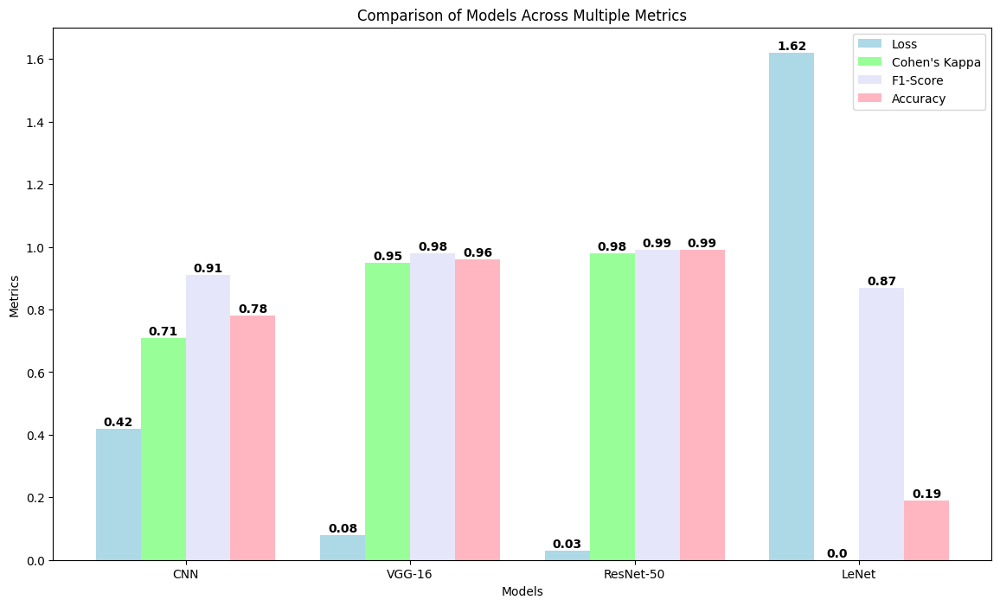

In [13]:
import matplotlib.pyplot as plt
import numpy as np

# داده‌های شما
models = ['CNN', 'VGG-16', 'ResNet-50', 'LeNet']

losses = [0.42, 0.08, 0.03, 1.62]
kappas = [0.71, 0.95, 0.98, 0.0]
f1_scores = [0.91, 0.98, 0.99, 0.87]
accuracies = [0.78, 0.96, 0.99, 0.19]
Training_Time=[75,181,362,27]

x = np.arange(len(models))  
width = 0.2  


plt.figure(figsize=(14, 8))


plt.bar(x - 1.5*width, losses, width, label='Loss', color='#ADD8E6')

plt.bar(x - 0.5*width, kappas, width, label="Cohen's Kappa", color='#98FF98')

plt.bar(x + 0.5*width, f1_scores, width, label='F1-Score', color='#E6E6FA')

plt.bar(x + 1.5*width, accuracies, width, label='Accuracy', color='#FFB6C1')

# plt.bar(x+1.5*width,Training_Time,width , label='Training Time',color='yellow')

plt.xlabel('Models')
plt.ylabel('Metrics')
plt.title('Comparison of Models Across Multiple Metrics')
plt.xticks(x, models)
plt.legend()

def add_values(bars):
    for bar in bars:
        plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.01, 
                 round(bar.get_height(), 2), ha='center', fontweight='bold')


bars_loss = plt.bar(x - 1.5*width, losses, width, label='Loss',color='#ADD8E6')
bars_kappa = plt.bar(x - 0.5*width, kappas, width, label="Cohen's Kappa",color='#98FF98')
bars_f1 = plt.bar(x + 0.5*width, f1_scores, width, label='F1-Score',color='#E6E6FA')
bars_acc = plt.bar(x + 1.5*width, accuracies, width, label='Accuracy',color='#FFB6C1')
# bars_time=plt.bar(x+1.5*width,Training_Time , width , label="Training Time",color='yellow')

add_values(bars_loss)
add_values(bars_kappa)
add_values(bars_f1)
add_values(bars_acc)
# add_values(bars_time)

plt.show()
